<a id="top"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><b>Image Explainability using XWhy</b></div>

<a id="1.2"></a>
<h2 style="font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #155D07; background-color: #ffffff;"><b>Comparing</b> Image Exlainability of XWhy with LIME and BayLIME</h2>

<p style="text-align: justify;">With the ever-increasing complexity of machine learning models, explainability has become an indispensable element of effective data analysis. Sophisticated algorithms like deep learning can offer tremendous predictive power, but their "black box" nature can obscure understanding and limit their practical application. Hence, the demand for tools and techniques that elucidate the decision-making processes of these models has grown significantly. Among the tools that have emerged to tackle this issue, model-agnostic approaches like Local Interpretable Model-Agnostic Explanations (LIME) and Bayesian Local Interpretable Model-Agnostic Explanations (BayLIME) have made substantial contributions. They provide localized explanations of predictions, offering insights into how and why a specific prediction was made, thus boosting the transparency and interpretability of complex models.</p>

<p style="text-align: justify;">However, as the field of explainability continues to evolve, the quest for superior methods remains unquenched. Our paper introduces a novel approach, X-Why, designed to enhance the explainability of machine learning models beyond the capabilities of existing methods utilizing statistical distance measures like Wasserstein. X-Why aims to improve the interpretability gap left by traditional methods like LIME and BayLIME, taking the science of model explainability a step further. The intent is to provide more comprehensive, intuitive, and robust interpretations of predictions, thus enabling more informed decision-making in software systems. This study aims to present a comparative analysis of X-Why with existing model-agnostic approaches to demonstrate its potential benefits and improvements over other techniques in the field of explainable artificial intelligence.</p>

<a id="top"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><b>Table of content</b></div>

<div style="background-color:aliceblue; padding:30px; font-size:15px;color:#034914">
    
* [Install Libraries](#1)
* [Import Libraries](#2)
* [Define logger](#3)
* [Define Input parameters](#4)
* [Define SmileImageClassfication](#5)
* [Explain Coverage and Weighted Coverage](#6)
* [Defining XWhy with Wasserstein Distance](#xwhy_wd)
* [Defining XWhy with Kolmogorov Smirnov Distance](#xwhy_ks)
* [Defining XWhy with Cramer-Von Mises Distance](#xwhy_cvm)
* [Defining XWhy with Anderson Darling Distance](#xwhy_ad)
* [Defining XWhy with Kuiper Distance](#xwhy_ku)
* [Define LIME](#lime)
* [Define LIME with embedding](#lime_emb)
* [Define BayLIME](#baylime)
* [Define BayLIME with embedding](#baylime_emb)
* [Define Kernel SHAP](#shap)
* [Comparative coverage of all methods](#comparative)
* [Comparison of heat maps of all methods](#comparative_heatmaps)
* [References](#ref)

<a id="1"></a>
# <div style="padding:20px;color:white;margin:0;font-size:20px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><b>Install libraries</b></div>

In [1]:
%pip install -q numpy~=2.0.2 pandas~=2.2.2 scipy~=1.16.3 transformers~=4.57.2 torch~=2.9.0 torchvision~=0.24.0 scikit-image~=0.25.2 scikit-learn~=1.6.1 pillow~=11.3.0 matplotlib~=3.10.0 tqdm~=4.67.1

<a id="2"></a>
# <div style="padding:20px;color:white;margin:0;font-size:20px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><b>Import libraries</b></div>

In [1]:
import os
import copy
import math
import logging
from typing import Any, Callable, Dict, List, Tuple
from tqdm import tqdm

from PIL import Image

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import torch
import torchvision.transforms as transforms
from torchvision.models import inception_v3, Inception_V3_Weights, Weights
from torchvision.models.segmentation import (
    deeplabv3_resnet101,
    DeepLabV3_ResNet101_Weights,
)
from transformers import AutoImageProcessor, AutoModel
from scipy.special import comb
from scipy.spatial.distance import cosine
from scipy.stats import (
    wasserstein_distance,
    ks_2samp,
    cramervonmises_2samp,
    anderson_ksamp,
)
from sklearn.linear_model import BayesianRidge, LinearRegression
import skimage.segmentation
import skimage.transform

<a id="3"></a>
# <div style="padding:20px;color:white;margin:0;font-size:20px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><b>Define logger</b></div>

In [2]:
logger = logging.getLogger(__name__)
logger.setLevel(logging.INFO)

<a id="4"></a>
# <div style="padding:20px;color:white;margin:0;font-size:20px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><b>Define Input parameters</b></div>

In [3]:
use_embedding_model = True
use_model_preprocess = False
image_path = "./cat-and-dog.jpg"

<a id="5"></a>
# <div style="padding:20px;color:white;margin:0;font-size:20px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><b>Define SmileImageClassification</b></div>

In [20]:
class SmileImageClassification:
    def __init__(
        self,
        image_path: str,
        use_model_preprocess: bool = False,
        need_normalization: bool = False,
        use_embedding_model: bool = False,
        seed: int = 222,
        kernel_size: int = 4,
        max_dist: int = 200,
        ratio: float = 0.2,
        num_perturb: int = 150,
        distance_metric: str = "wasserstein",
        explanation_model: str = "linear_regression",
        num_top_features: int = 4,   # Number of features to highlight in the explanation
        num_top_predictions: int = 5,        # Number of top predictions to analyze
    ) -> None:
        self.image_path = image_path
        # Use model's official preprocessing (InceptionV3 mean/std) instead of the simple [-1, 1] one
        self.use_model_preprocess = use_model_preprocess
        # No denormalization required for display
        self.need_normalization = need_normalization

        # Store Superpixel & Perturbation Params
        self.use_embedding_model = use_embedding_model
        self.seed = seed
        self.kernel_size = kernel_size
        self.max_dist = max_dist
        self.ratio = ratio
        self.num_perturb = num_perturb
        self.num_top_features = num_top_features
        self.num_top_predictions = num_top_predictions
        self.device = "cuda" if torch.cuda.is_available() else "cpu"

        # Store Distance Metric
        # Normalize string to lowercase to avoid case-sensitivity issues
        self.distance_metric = distance_metric.lower()
        valid_metrics = ["wasserstein", "cosine", "ks", "cramer_von_mises", "anderson_darling", "kuiper"]
        if self.distance_metric not in valid_metrics:
            raise ValueError(f"Invalid distance_metric. Choose from: {valid_metrics}")

        logger.info(f"Initialized with Distance Metric: {self.distance_metric}")

        # Store the explanation model choice
        valid_models = ["linear_regression", "bayesian_ridge"]
        model_choice = explanation_model.lower().replace(' ', '_')
        if model_choice not in valid_models:
            raise ValueError(f"Invalid explanation model: {explanation_model}. Must be one of {valid_models}")

        self.explanation_model = model_choice

        # Load Classification Model with official weights (includes labels)
        self.model_weights = Inception_V3_Weights.DEFAULT
        self.model = inception_v3(weights=self.model_weights)
        # Set the model to evaluation mode
        self.model.eval()

        # Setup Embedding Model (DINOv2) if requested
        if self.use_embedding_model:
            self._setup_embedding_model()

        # Setup Segmentation Model (DeepLabV3+ for General Object Segmentation)
        logger.info("Loading DeepLabV3+ segmentation model...")

        # Use the latest default weights for robustness (usually COCO or PASCAL)
        self.seg_weights = DeepLabV3_ResNet101_Weights.DEFAULT

        # Load the model with pre-trained weights
        self.segmentation_model = deeplabv3_resnet101(weights=self.seg_weights).to(self.device)
        self.segmentation_model.eval()

        # Store the class names for the chosen dataset (e.g., COCO or PASCAL)
        # These are used for optional logging/debugging.
        self.seg_class_names = self.seg_weights.meta["categories"]
        logger.info(f"Segmentation model classes: {self.seg_class_names}")

    def _setup_embedding_model(self):
        """Helper to setup DINOv2 if requested"""
        logger.info("Setting seeds for reproducibility...")
        np.random.seed(self.seed)
        torch.manual_seed(self.seed)
        if torch.cuda.is_available():
            torch.cuda.manual_seed_all(self.seed)
            torch.backends.cudnn.deterministic = True
            torch.backends.cudnn.benchmark = False

        logger.info("Setup Facebook DINOv2 processor & model...")
        self.embedding_processor = AutoImageProcessor.from_pretrained("facebook/dinov2-base", use_fast=True)
        self.embedding_model = AutoModel.from_pretrained("facebook/dinov2-base").to(self.device)

    # ------------------------------------------------------------------------
    #  Main Distance Wrapper
    # ------------------------------------------------------------------------
    def calculate_distance(
        self,
        org: np.ndarray,
        pert: np.ndarray
    ) -> float:
        """
        Compute the distance between an original array and a perturbed array.

        The distance metric is determined by the instance configuration. Some
        metrics require flattened 1D arrays (e.g., Wasserstein, Cosine), while
        distribution-based metrics delegate to helper functions which
        internally handle dimensionality.

        Args:
            org (np.ndarray): Original input array.
            pert (np.ndarray): Perturbed input array.

        Returns:
            float: The computed distance based on the selected metric.
        """
        # 1. Determine if the array needs to be flattened for the specific
        # metric. Metrics requiring simple vector comparison (Wasserstein,
        # Cosine) or those that require 1D for their implementation are
        # flattened here.

        org_proc = org
        pert_proc = pert

        # These metrics require 1D input (or the helper functions handle
        # flattening)
        if self.distance_metric in ["wasserstein", "cosine"]:
            if org_proc.ndim > 1:
                org_proc = org.flatten()
                pert_proc = pert.flatten()

        # 2. Dispatch based on metric
        if self.distance_metric == "wasserstein":
            # org_proc/pert_proc are 1D
            return wasserstein_distance(org_proc, pert_proc)

        elif self.distance_metric == "cosine":
            # org_proc/pert_proc are 1D
            return cosine(org_proc, pert_proc)

        # Distribution-based metrics call the helper functions.
        # org/pert might be 1D (embedding) or 3D (image).
        # The helper functions handle the internal dimensionality.
        elif self.distance_metric == "ks":
            return self.ks_dist_image(org, pert)

        elif self.distance_metric == "cramer_von_mises":
            return self.cramer_von_mises_dist_image(org, pert)

        elif self.distance_metric == "anderson_darling":
            return self.anderson_darling_dist_image(org, pert)

        elif self.distance_metric == "kuiper":
            return self.kuiper_dist_image(org, pert)

        else:
            return float('inf')

    def load_and_preprocess(
        self,
        image_path: str | None = None,
        model_weights: Weights = None,
        default_normalize: bool = None
    ):
        """
        Load an image from disk and preprocess it using either the model's
        official preprocessing pipeline or a custom normalization routine.

        Args:
            image_path (str | None): Path to the input image. If None, the
                instance's default image_path is used.
            model_weights (Weights): Weights object providing transforms() that
                includes mean and std values for normalization.
            default_normalize (bool | None): If True, use the model's official
                preprocessing. If False, use a custom preprocessing pipeline.
                If None, the instance's use_model_preprocess is used.

        Returns:
            tuple[torch.Tensor, Image.Image]: A tuple containing the processed
                tensor (with batch dimension added) and the original RGB PIL
                image.
        """
        image_path = image_path if image_path else self.image_path
        model_weights = model_weights if model_weights is not None else self.model_weights
        default_normalize = default_normalize if default_normalize else self.use_model_preprocess

        img = Image.open(image_path).convert("RGB")
        if default_normalize:
            # Use the model's official preprocessing transforms
            preprocess = model_weights.transforms()
        else:
            # Custom preprocessing pipeline with resizing and normalization
            preprocess = transforms.Compose([
                transforms.Resize(299),
                transforms.CenterCrop(299),
                transforms.ToTensor(),
                transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]),
            ])

        # Add a batch dimension to the processed tensor
        processed_tensor = preprocess(img).unsqueeze(0)
        return processed_tensor, img   # tensor (with batch) and original PIL img

    def denormalize_image_tensor(
        self,
        img_tensor: torch.Tensor,
        model_weights: Weights = None
    ) -> torch.Tensor:
        """
        Reverse the normalization applied to an image tensor using the model's
        preprocessing mean and standard deviation values.

        Args:
            img_tensor (torch.Tensor): Normalized image tensor with shape
                (B, C, H, W).
            model_weights (Weights): Weights object providing transforms() that
                includes mean and std values for normalization.

        Returns:
            torch.Tensor: The denormalized image tensor.
        """
        model_weights = model_weights if model_weights is not None else self.model_weights

        mean = model_weights.transforms().mean
        std = model_weights.transforms().std

        # Clone the tensor to avoid modifying the original in-place
        denorm_img = img_tensor.clone()

        # Reshape mean and std to be broadcastable (1, C, 1, 1)
        mean_tensor = torch.tensor(mean, device=denorm_img.device).view(1, -1, 1, 1)
        std_tensor = torch.tensor(std, device=denorm_img.device).view(1, -1, 1, 1)

        # Reverse normalization: (output * std) + mean
        denorm_img = (denorm_img * std_tensor) + mean_tensor
        return denorm_img

    def show_image_tensor(
        self,
        img: Any,
        title: str | None = None,
        apply_normalization: bool | None = None
    ) -> None:
        """
        Display an image represented as a PyTorch tensor, NumPy array, or PIL
        image. Handles optional preprocessing reversal (e.g., Inception-style
        normalization) and converts the image to a [0, 1] range for
        visualizing.

        Args:
            img (Any): Input image. Can be a torch.Tensor, numpy.ndarray, or
                PIL.Image.
            title (str | None): Optional title to show above the image.
            apply_normalization (bool | None): Whether to apply the model's
                inverse preprocessing prior to display. If None, defaults to
                the instance's use_model_preprocess flag.

        Returns:
            None: Displays the image using matplotlib.
        """
        apply_normalization = apply_normalization if apply_normalization else self.use_model_preprocess

        # -----------------------------
        # Case 0: numpy array and need denormalization
        # -----------------------------
        if isinstance(img, np.ndarray) and apply_normalization:
            marked_image_tensor_chw = torch.from_numpy(img).permute(2, 0, 1).float()
            marked_image_tensor_bchw = marked_image_tensor_chw.unsqueeze(0)

            # Denormalize the marked image tensor
            img = self.denormalize_image_tensor(marked_image_tensor_bchw, self.model_weights)

        # -----------------------------
        # Case 1: PyTorch Tensor
        # -----------------------------
        if torch.is_tensor(img):
            img = img.detach().cpu()

            # Remove batch dimension (1,3,H,W)
            if img.ndim == 4 and img.shape[0] == 1:
                img = img[0]

            # Convert C×H×W => H×W×C
            if img.ndim == 3 and img.shape[0] == 3:
                img = img.permute(1, 2, 0)

            img = img.numpy()

        # -----------------------------
        # Case 2: PIL Image => convert to numpy
        # -----------------------------
        elif isinstance(img, Image.Image):
            img = np.array(img).astype(np.float32) / 255.0  # convert to [0,1]

        # -----------------------------
        # Case 3: already numpy array
        # -----------------------------
        elif isinstance(img, np.ndarray):
            img = img.astype(np.float32)

            # If uint8 image, convert to [0,1]
            if img.max() > 1.0:
                img = img / 255.0

        else:
            raise TypeError(f"Unsupported image type: {type(img)}")

        # -----------------------------
        # Fix normalized images: [-1,1] => [0,1]
        # -----------------------------
        if img.min() < 0:
            img = (img + 1.0) / 2.0

        img = img.clip(0, 1)

        # -----------------------------
        # Display
        # -----------------------------
        plt.figure(figsize=(8, 6))
        plt.imshow(img)
        if title:
            plt.title(title)
        plt.axis("off")
        plt.show()

    def get_segmentation_mask(
        self,
        img_path: str | None = None
    ) -> Tuple[Image.Image, np.ndarray]:
        """
        Generate a semantic segmentation mask and a colored visualization using
        the loaded DeepLabV3 model. The method supports arbitrary numbers and
        types of objects and maps detected classes to sequential labels.

        Args:
            img_path (str | None): Optional path to the input image. If None,
                the instance's default image_path is used.

        Returns:
            Tuple[Image.Image, np.ndarray]: A tuple where the first element is
                a PIL image visualizing the segmentation mask and the second is
                a NumPy array containing sequential integer labels for each
                object (0 for background).
        """
        img_path = img_path if img_path else self.image_path

        # 1. Load and Preprocess Image
        img_pil = Image.open(img_path).convert("RGB")
        width, height = img_pil.size

        preprocess = self.seg_weights.transforms()
        input_tensor = preprocess(img_pil).unsqueeze(0).to(self.device)

        # 2. Inference
        with torch.no_grad():
            output = self.segmentation_model(input_tensor)['out'][0]

        # Get the predicted class index for each pixel (H, W)
        prediction = output.argmax(0).byte().cpu().numpy()

        # 3. Resize mask back to original image size
        if prediction.shape != (height, width):
            prediction = skimage.transform.resize(
                prediction, (height, width), order=0, preserve_range=True,
                anti_aliasing=False
            ).astype(np.uint8)

        # 4. Create the final semantic mask (sem_mask) and Visualization

        # sem_mask will hold your sequential labels (0, 1, 2, ...)
        sem_mask = np.zeros((height, width), dtype=np.uint8)

        # visual_np will hold the colored visualization
        visual_np = np.full((height, width, 3), 128, dtype=np.uint8)  # Start with gray BG (128, 128, 128)

        # Get the unique class IDs found by the segmentation model (e.g., 8, 12, 15)
        unique_class_ids = np.unique(prediction)

        # Filter out the background ID (typically 0)
        object_class_ids = [cls_id for cls_id in unique_class_ids if cls_id != 0]

        # Use a set of distinct colors for visualization
        # We use a known, high-contrast palette. (0, 0, 0) is background,
        # so we avoid black/white.
        vis_palette = [
            (255, 0, 0), (0, 255, 0), (0, 0, 255), (255, 255, 0), (0, 255, 255),
            (255, 0, 255), (170, 0, 0), (0, 170, 0), (0, 0, 170)
        ]

        # 5. Map detected objects to sequential labels (1, 2, 3...)

        # Start sequential label counter at 1 (0 is always background)
        sequential_label = 1

        for cls_id in object_class_ids:
            # Create a mask for all pixels belonging to the current object class ID
            mask = (prediction == cls_id)

            # Assign the sequential label to the semantic mask
            sem_mask[mask] = sequential_label

            # Assign a unique visualization color (cycle through palette)
            color = vis_palette[(sequential_label - 1) % len(vis_palette)]
            visual_np[mask] = color

            # Log the mapping for debugging
            class_name = self.seg_class_names[cls_id] if cls_id < len(self.seg_class_names) else f"Unknown_ID_{cls_id}"
            logger.info(f"Mapping model class '{class_name}' (ID: {cls_id}) to sequential label: {sequential_label}")

            # Increment the sequential label counter for the next object
            sequential_label += 1

        # 6. Final conversion
        visual_image = Image.fromarray(visual_np)

        return visual_image, sem_mask

    def generate_superpixels(
        self,
        tensor_img: torch.Tensor,
        kernel_size: int | None = None,
        max_dist: int | None = None,
        ratio: float | None = None,
        seed: int | None = None
    ) -> Tuple[np.ndarray, int]:
        """
        Generate superpixels using the Quickshift algorithm for a given image
        tensor or NumPy array. Supports both (C, H, W) and (H, W, C) formats
        and falls back to class-level parameters when optional arguments are
        omitted.

        Args:
            tensor_img (torch.Tensor | np.ndarray): Input image in either CHW
                or HWC format with values in [0, 1].
            kernel_size (int | None): Quickshift kernel size. If None, uses the
                instance's default.
            max_dist (int | None): Maximum spatial distance for Quickshift. If
                None, uses the instance's default.
            ratio (float | None): Balance between color and spatial proximity
                for Quickshift. If None, uses the instance's default.
            seed (int | None): Random seed for reproducibility. If None, the
                instance's default seed is used.

        Returns:
            Tuple[np.ndarray, int]: A tuple containing the superpixel label map
                (H, W) and the number of unique superpixel regions.
        """
        # Use class attributes if arguments are not provided
        k_size = kernel_size if kernel_size is not None else self.kernel_size
        m_dist = max_dist if max_dist is not None else self.max_dist
        rat = ratio if ratio is not None else self.ratio
        segmentation_seed = seed if seed is not None else self.seed

        # Ensure image is H x W x C numpy array
        if isinstance(tensor_img, torch.Tensor):
            if tensor_img.ndim == 3 and tensor_img.shape[0] == 3:
                # C,H,W => H,W,C
                img_np = tensor_img.permute(1, 2, 0).cpu().numpy()
            elif tensor_img.ndim == 3 and tensor_img.shape[2] == 3:
                img_np = tensor_img.cpu().numpy()
            else:
                raise ValueError(f"Unexpected tensor shape: {tensor_img.shape}")
        elif isinstance(tensor_img, np.ndarray):
            img_np = tensor_img
        else:
            raise TypeError("tensor_img must be a torch.Tensor or np.ndarray")

        # Quickshift superpixels
        superpixels = skimage.segmentation.quickshift(
            img_np,
            kernel_size=k_size,
            max_dist=m_dist,
            ratio=rat,
            rng=segmentation_seed
        )
        # Number of unique superpixels
        num_superpixels = np.unique(superpixels).shape[0]

        return superpixels, num_superpixels

    def generate_perturbations(
        self,
        num_superpixels: int,
        num_perturb: int | None = None,
        keep_probability: float = 0.5
    ) -> np.ndarray:
        """
        Generate binary perturbation masks for a given number of superpixels
        using Bernoulli sampling. Each row represents one perturbation sample,
        where 1 indicates a superpixel is kept and 0 indicates it is removed.

        Args:
            num_superpixels (int): Number of superpixel regions.
            num_perturb (int | None): Number of perturbation samples to
                generate. If None, the instance's default value is used.
            keep_probability (float): Probability of keeping a superpixel
                (value = 1) during sampling.

        Returns:
            np.ndarray: A binary matrix of shape (num_perturb, num_superpixels)
                containing the generated perturbation masks.
        """
        # Use class attribute if argument not provided
        n_perturb = num_perturb if num_perturb is not None else self.num_perturb

        return np.random.binomial(
            n=1,
            p=keep_probability,
            size=(n_perturb, num_superpixels)
        )

    def perturb_image(
        self,
        img: np.ndarray,
        perturbation: np.ndarray,
        segments: np.ndarray
    ) -> np.ndarray:
        """
        Apply a binary perturbation mask to an image based on superpixel
        segments.

        Args:
            img (np.ndarray): Input image array of shape (H, W, C).
            perturbation (np.ndarray): Binary array indicating which
                superpixels to keep (1) or remove (0), shape
                (num_superpixels,).
            segments (np.ndarray): Segmentation map labeling each pixel with
                its superpixel ID, shape (H, W).

        Returns:
            np.ndarray: Perturbed image where only active superpixels are kept
                and inactive ones are zeroed out.
        """
        active_pixels = np.where(perturbation == 1)[0]
        mask = np.zeros(segments.shape)
        for active in active_pixels:
            mask[segments == active] = 1
        perturbed_image = copy.deepcopy(img)
        perturbed_image = perturbed_image*mask[:, :, np.newaxis]
        return perturbed_image

    def extract_image_embedding(
        self,
        image: Image.Image,
    ) -> np.ndarray:
        """
        Extract an image embedding using a DINOv2 model.

        Args:
            image (PIL.Image.Image): Input image.

        Returns:
            np.ndarray: Extracted embedding vector.
        """
        inputs = self.embedding_processor(
            images=image,
            return_tensors="pt",
            do_rescale=False
        )

        with torch.no_grad():
            outputs = self.embedding_model(**inputs)

        emb = outputs.last_hidden_state.mean(dim=1)
        emb = emb.squeeze().cpu().numpy()
        return emb

    def preprocess_numpy(
        self,
        np_array: np.ndarray,
        model_weights: Weights = None,
        default_normalize: bool = None
    ):
        """
        Preprocess a numpy image using the same transforms as
        load_and_preprocess().

        Args:
            np_array: numpy array of shape (H, W, C), values expected in [0,1]
                or [0,255]
            model_weights (Weights): Weights object providing transforms() that
                includes mean and std values for normalization.
            default_normalize: True => use weights.transforms(),
                False => use custom preprocessing

        Returns:
            torch tensor of shape (1, 3, 299, 299)
        """
        model_weights = model_weights if model_weights else self.model_weights
        default_normalize = default_normalize if default_normalize else self.use_model_preprocess

        # Ensure input is uint8 before converting to PIL
        # If your numpy is [0,1], convert to [0,255]
        if np_array.dtype != np.uint8:
            img_uint8 = (np_array * 255).astype(np.uint8)
        else:
            img_uint8 = np_array

        # Convert numpy HWC => PIL
        img = Image.fromarray(img_uint8)

        # Get correct preprocessing pipeline
        if default_normalize:
            preprocess = model_weights.transforms()
        else:
            preprocess = transforms.Compose([
                transforms.Resize(299),
                transforms.CenterCrop(299),
                transforms.ToTensor(),
                transforms.Normalize(
                    mean=[0.5, 0.5, 0.5],
                    std=[0.5, 0.5, 0.5]
                )
            ])

        # Apply transforms => produces C×H×W
        tensor = preprocess(img)

        # Add batch dimension => 1×C×H×W
        return tensor.unsqueeze(0)

    def get_coverage(
        self,
        smile_mask: np.ndarray,
        sem_mask: np.ndarray,
        coi: int = 1
    ) -> float:
        """
        Computes the percentage of the true label (coi) covered by the SMILE
        explainer.

        Args:
            smile_mask (np.ndarray): The 3D SMILE explanation image (non-zero
                where features are selected).
            sem_mask (np.ndarray): The 2D semantic mask (0=BG, 1, 2, 3...
                =Objects).
            coi (int): The sequential label of the object to evaluate (default
                is 1, the first object found).

        Returns:
            float: The simple coverage score.
        """
        # 1. Identify the target area (COI) and the pixels where SMILE is 'active'.
        target_area_mask = (sem_mask == coi)
        total_target_pixels = np.count_nonzero(target_area_mask)

        if total_target_pixels == 0:
            return 0.0

        # SMILE is 'active' where the explanation image is non-zero (i.e., a feature is present).
        # We use np.mean(smile_mask, axis=-1) to get a 2D map of active pixels.
        # Note: `sum(input_im[i, j]) > 0` is equivalent to checking if any channel is > 0.
        lime_active_2d = np.any(smile_mask > 0, axis=-1)

        # 2. Calculate Rewards (True Positives) and Penalties (False Positives).

        # Reward (True Positives): SMILE is active AND it covers the COI.
        reward_mask = lime_active_2d & target_area_mask
        rewards = np.count_nonzero(reward_mask)

        # Penalty (False Positives): SMILE is active AND it covers OTHER OBJECTS.
        # This maintains the original intent of penalizing coverage over non-target objects.
        other_objects_mask = (sem_mask != 0) & (sem_mask != coi)
        penalty_mask = lime_active_2d & other_objects_mask
        penalties = np.count_nonzero(penalty_mask)

        # Total score (tot) = Rewards - Penalties
        tot = rewards - penalties

        # 3. Normalize by the total number of pixels in the Class of Interest.
        cov = tot / total_target_pixels

        return cov

    def get_weighted_coverage(
        self,
        smile_mask: np.ndarray,
        sem_mask: np.ndarray,
        coi: int = 1,
    ) -> float:
        """
        Computes weighted coverage, rewarding SMILE feature importance over
        the COI and penalizing importance over other detected objects.

        Args:
            smile_mask (np.ndarray): The 3D SMILE explanation image (pixel
                values = importance).
            sem_mask (np.ndarray): The 2D semantic mask (0=BG, 1, 2, 3...
                =Objects).
            coi (int): The sequential label of the object to evaluate (default
                is 1).

        Returns:
            float: The weighted coverage score.
        """
        # 1. Create a 2D weight map based on the semantic mask.
        # We maintain the penalty structure: +1 for COI, -1 for OTHER
        # OBJECTS/BACKGROUND.

        weight_map_2d = np.zeros_like(sem_mask, dtype=np.float32)

        # Reward: Set COI pixels to +1.0
        weight_map_2d[sem_mask == coi] = 1.0

        # Penalty: Set all other areas (including background, sem_mask != coi)
        # to -1.0. This is slightly different from the old method (which only
        # penalised 0 and 2), but based on the original logic:
        # np.place(copy_mask, copy_mask == 0, -1) and np.place(copy_mask,
        # copy_mask == 2, -1) implies all non-COI and background are penalized.

        # Generalized Penalty: All areas NOT belonging to COI are penalized.
        penalty_mask = (sem_mask != coi)
        weight_map_2d[penalty_mask] = -1.0

        # 2. Expand the 2D weight map to match the 3D SMILE mask channels (H, W, 3)
        expanded_weight_map = weight_map_2d[:, :, np.newaxis]

        # 3. Calculate the total weighted sum: (SMILE importance * Semantic Weight)
        # The multiplication `smile_mask * expanded_weight_map` maintains the sign.
        weighted_contribution = smile_mask * expanded_weight_map

        # Sum over height, width, and channels to get one scalar total sum
        tot = np.sum(weighted_contribution)

        # 4. Calculate the normalization factor.
        # The original normalization factor was `H * W * C`, implying normalization
        # by the maximum possible value (assuming pixel values are <= 1.0).
        H, W, C = smile_mask.shape
        normalization_factor = H * W * C # Keep original normalization structure for consistency

        w_cov = tot / normalization_factor

        return w_cov

    def create_heat_mask(
        self, superpixels_b, coeff
    ):
        # Initialize an empty image
        heat_mask = np.zeros_like(superpixels_b, dtype=float)

        # Iterate over the unique labels of the superpixels
        for idx, label in enumerate(np.unique(superpixels_b)):
            # Set the pixels of the current superpixel to its corresponding coefficient
            heat_mask[superpixels_b == label] = coeff[idx]

        return heat_mask

    # ------------------------------------------------------------------------
    #  Specific Distance Implementations
    # ------------------------------------------------------------------------

    def wasserstein_dist_image(
        self,
        img1: np.ndarray,
        img2: np.ndarray
    ) -> float:
        """
        Compute the Wasserstein distance between two images channel-wise.

        Args:
            img1 (np.ndarray): First image array with shape (H, W, C).
            img2 (np.ndarray): Second image array with shape (H, W, C).

        Returns:
            float: Sum of Wasserstein distances across all channels. Returns
                infinity if the image shapes do not match.
        """
        if img1.shape != img2.shape:
            logger.warning(f'Shape mismatch: {img1.shape} vs {img2.shape}')
            return float('inf')

        wd_total = 0
        # Iterate over channels (R, G, B)
        # Assuming format is (Height, Width, Channels)
        channels = img1.shape[2]

        for i in range(channels):
            # Flatten the channel to 1D array
            hist1 = img1[:, :, i].flatten()
            hist2 = img2[:, :, i].flatten()

            # Use Scipy's optimized implementation
            wd_total += wasserstein_distance(hist1, hist2)

        return wd_total

    def _calculate_channel_distance(
        self,
        img1: np.ndarray,
        img2: np.ndarray,
        dist_func: Callable
    ) -> float:
        """
        Helper function to compute a distance between two arrays, supporting
        both 1D embeddings and 3D images.

        Args:
            img1 (np.ndarray): First input array (1D embedding or 3D image
                HWC).
            img2 (np.ndarray): Second input array with the same shape as img1.
            dist_func (Callable): Distance function to apply. Can return a
                float, tuple, or an object with a 'statistic' attribute.

        Returns:
            float: Computed distance. For 3D images, returns sum across
                channels. Returns infinity if shapes do not match.

        Raises:
            ValueError: If input dimensionality is unsupported.
        """
        if img1.shape != img2.shape:
            return float('inf')

        # Helper function to extract the distance value from the result
        def _extract_statistic(result):
            # Check if the result is a number (float, int, or numpy number)
            if isinstance(result, (float, int, np.number)):
                return result
            # Check if the result is a tuple (like ks_2samp)
            elif isinstance(result, tuple):
                return result[0]
            # Otherwise, assume it's a scipy result object
            else:
                return result.statistic

        # Case 1: 1D Array (Embedding Vector)
        if img1.ndim == 1:
            res = dist_func(img1, img2)
            return _extract_statistic(res)

        # Case 2: 3D Image (H, W, C)
        elif img1.ndim == 3:
            dist_total = 0
            channels = img1.shape[2]

            for i in range(channels):
                hist1 = img1[:, :, i].flatten()
                hist2 = img2[:, :, i].flatten()

                res = dist_func(hist1, hist2)
                dist_total += _extract_statistic(res)

            return dist_total

        else:
            # Catch unexpected dimensionality
            raise ValueError(f"Unsupported input dimensionality: {img1.ndim}")

    def ks_dist_image(
        self,
        img1: np.ndarray,
        img2: np.ndarray
    ) -> float:
        """
        Compute the Kolmogorov-Smirnov (KS) distance between two arrays or images
        channel-wise.

        Args:
            img1 (np.ndarray): First input array (1D embedding or 3D image HWC).
            img2 (np.ndarray): Second input array with the same shape as img1.

        Returns:
            float: Sum of KS distances across channels for 3D images or the KS
                statistic for 1D arrays.
        """
        def ks_wrapper(a, b):
            return ks_2samp(a, b)

        return self._calculate_channel_distance(img1, img2, ks_wrapper)

    def cramer_von_mises_dist_image(
        self,
        img1: np.ndarray,
        img2: np.ndarray
    ) -> float:
        """
        Compute the Cramer-Von Mises (CvM) distance between two arrays or images
        channel-wise.

        Args:
            img1 (np.ndarray): First input array (1D embedding or 3D image HWC).
            img2 (np.ndarray): Second input array with the same shape as img1.

        Returns:
            float: Sum of CvM distances across channels for 3D images or the CvM
                statistic for 1D arrays.
        """
        def cvm_wrapper(a, b):
            return cramervonmises_2samp(a, b)

        return self._calculate_channel_distance(img1, img2, cvm_wrapper)

    def anderson_darling_dist_image(
        self,
        img1: np.ndarray,
        img2: np.ndarray
    ) -> float:
        """
        Compute the Anderson-Darling (k-sample) distance between two arrays or
        images channel-wise.

        Args:
            img1 (np.ndarray): First input array (1D embedding or 3D image HWC).
            img2 (np.ndarray): Second input array with the same shape as img1.

        Returns:
            float: Sum of Anderson-Darling statistics across channels for 3D
                images or the statistic for 1D arrays.
        """
        def ad_wrapper(a, b):
            return anderson_ksamp([a, b])

        return self._calculate_channel_distance(img1, img2, ad_wrapper)

    def kuiper_dist_image(
        self,
        img1: np.ndarray,
        img2: np.ndarray
    ) -> float:
        """
        Compute the Kuiper distance between two arrays or images channel-wise
        using a custom numpy implementation.

        Args:
            img1 (np.ndarray): First input array (1D embedding or 3D image HWC).
            img2 (np.ndarray): Second input array with the same shape as img1.

        Returns:
            float: Sum of Kuiper distances across channels for 3D images or the
                Kuiper statistic for 1D arrays.
        """
        def kuiper_wrapper(a, b):
            return self._calculate_kuiper_numpy(a, b)

        return self._calculate_channel_distance(img1, img2, kuiper_wrapper)

    def _calculate_kuiper_numpy(
        self,
        data1: np.ndarray,
        data2: np.ndarray
    ) -> float:
        """
        Optimized numpy implementation of the Kuiper distance for two 1D arrays.
        Scipy does not provide a native 2-sample Kuiper function.

        Args:
            data1 (np.ndarray): First 1D array.
            data2 (np.ndarray): Second 1D array.

        Returns:
            float: Kuiper distance between the two input arrays.
        """
        # Sort data
        d1 = np.sort(data1)
        d2 = np.sort(data2)
        n1, n2 = len(d1), len(d2)

        # Concatenate and sort all data points to find the common domain
        all_val = np.concatenate([d1, d2])
        all_val.sort()

        # Compute Empirical CDFs at the common points
        # searchsorted finds the index where values would be inserted
        cdf1 = np.searchsorted(d1, all_val, side='right') / n1
        cdf2 = np.searchsorted(d2, all_val, side='right') / n2

        # Kuiper statistic = max(cdf1 - cdf2) + max(cdf2 - cdf1)
        diff = cdf1 - cdf2
        d_plus = np.max(diff)
        d_minus = np.max(-diff)

        return d_plus + d_minus

    # ------------------------------------------------------------------------
    #  Specific Running Implementations Methods
    # ------------------------------------------------------------------------

    def tensor_to_numpy_image(
        self,
        tensor_batch: torch.Tensor
    ) -> np.ndarray:
        """
        Convert a batch tensor (1, C, H, W) to a denormalized NumPy image
        (H, W, C). Optionally reverses model preprocessing if used.

        Args:
            tensor_batch (torch.Tensor): Input tensor batch of shape (1, C, H, W).

        Returns:
            np.ndarray: Denormalized image as a NumPy array with shape (H, W, C)
                and values clipped to [0, 1].
        """
        # 1. Remove batch dim (1, C, H, W) -> (C, H, W)
        img_tensor = tensor_batch.squeeze(0)

        # 2. Denormalize if the model used its official mean/std
        if self.use_model_preprocess:
            # We need to add batch dim back for denormalize method
            img_tensor = self.denormalize_image_tensor(img_tensor.unsqueeze(0), self.model_weights).squeeze(0)

        # 3. Convert (C, H, W) -> (H, W, C) and move to NumPy
        img_np = img_tensor.permute(1, 2, 0).detach().cpu().numpy()

        # 4. Clip to ensure valid range [0, 1] (important for segmentation)
        img_np = np.clip(img_np, 0, 1)
        return img_np

    def run_perturbation_loop(
        self,
        xi_img: np.ndarray,
        superpixels: np.ndarray,
        perturbations: np.ndarray
    ) -> Tuple[np.ndarray, np.ndarray]:
        """
        Run a loop over perturbations, compute model predictions, and calculate
        distances between original and perturbed images or embeddings.

        Args:
            xi_img (np.ndarray): Original image of shape (H, W, C).
            superpixels (np.ndarray): Superpixel segmentation mask.
            perturbations (np.ndarray): Binary masks indicating active
                superpixels for each perturbation.

        Returns:
            Tuple[np.ndarray, np.ndarray]:
                - predictions: Model output probabilities for each
                    perturbation.
                - distances: Calculated distances for each perturbation.
        """
        predictions = None
        distances = []

        # Move model to GPU if available
        self.model = self.model.to(self.device)

        # Pre-calculate original embedding if needed (Optimization: do this once)
        if self.use_embedding_model:
            org_img_emb = self.extract_image_embedding(xi_img)
            if org_img_emb is None: raise ValueError("Original embedding extraction failed.")
            org_img_emb = np.asarray(org_img_emb)

        logger.info(f"Running inference on {len(perturbations)} perturbations...")
        for pert in tqdm(perturbations):
            # A. Perturb
            perturbed_img = self.perturb_image(xi_img, pert, superpixels)

            # B. Preprocess for Model
            in_batch = self.preprocess_numpy(perturbed_img).to(self.device)

            # C. Inference
            with torch.no_grad():
                pred = self.model(in_batch)

            # Store predictions
            if predictions is None:
                predictions = pred.detach().cpu().numpy()
            else:
                predictions = np.concatenate((predictions, pred.detach().cpu().numpy()), 0)

            # D. Calculate Distance
            if self.use_embedding_model:
                pert_emb = self.extract_image_embedding(perturbed_img)
                dist = self.calculate_distance(org_img_emb, np.asarray(pert_emb))
            else:
                dist = self.calculate_distance(xi_img, perturbed_img)

            distances.append(dist)

        return predictions, np.array(distances)

    def compute_explanation(
        self,
        perturbations: np.ndarray,
        predictions: np.ndarray,
        distances: np.ndarray,
        label_idx: int,
        kernel_width: float = 0.25
    ) -> np.ndarray:
        """
        Fit a local linear model (LinearRegression or BayesianRidge) to explain
        the complex model's prediction for a specific class label.

        Args:
            perturbations (np.ndarray): Binary superpixel perturbation masks.
            predictions (np.ndarray): Model output probabilities for each
                perturbation.
            distances (np.ndarray): Distances between original and perturbed
                images/embeddings.
            label_idx (int): Index of the target class label.
            kernel_width (float): Kernel width for weighting perturbations.
                Closer perturbations receive higher weight.

        Returns:
            np.ndarray: Coefficients of the fitted linear model indicating
                feature importance for each superpixel.
        """
        # Check for zero distance sum (shouldn't happen, but good practice)
        if np.sum(distances) == 0:
            logger.warning("All distances are zero. Cannot normalize.")

        # Rescale the distances to a small range (e.g., max distance becomes 1.0)
        max_dist = np.max(distances)
        if max_dist > 0:
            normalized_distances = distances / max_dist
        else:
            normalized_distances = distances

        # 1. Calculate Kernel Weights (closer images = higher weight)
        weights = np.sqrt(np.exp(-(normalized_distances**2) / kernel_width**2))

        # 2. Select and Instantiate the Model
        if self.explanation_model == "bayesian_ridge":
            # BayesianRidge is often more robust but slower than LinearRegression
            simpler_model = BayesianRidge()
            logger.info("Using BayesianRidge for explanation model.")
        elif self.explanation_model == "linear_regression":
            # LinearRegression (default and standard LIME model)
            simpler_model = LinearRegression()
            logger.info("Using LinearRegression for explanation model.")
        else:
            # Should be caught in __init__, but as a safeguard
            raise ValueError(f"Unsupported explanation model: {self.explanation_model}")

        # 3. Fit the Model
        simpler_model.fit(
            X=perturbations,
            y=predictions[:, label_idx],
            sample_weight=weights
        )

        # 4. Extract coefficients
        coeffs = simpler_model.coef_

        return coeffs

    def visualize_heatmap(
        self,
        superpixels: np.ndarray,
        coeffs: np.ndarray,
        title: str = "Heatmap of Coefficients"
    ) -> np.ndarray:
        """
        Visualize a heatmap representing feature importance coefficients over
        superpixels.

        Args:
            superpixels (np.ndarray): Superpixel segmentation mask of the
                image.
            coeffs (np.ndarray): Importance coefficients for each superpixel.
            title (str): Title for the heatmap plot.

        Returns:
            np.ndarray: The generated heatmap array.
        """
        heat_mask = self.create_heat_mask(superpixels, coeffs)

        plt.figure(figsize=(8, 6))
        plt.imshow(heat_mask, cmap='plasma', interpolation='nearest')
        plt.colorbar()
        plt.title(title)
        plt.axis('off')
        plt.show()

        return heat_mask

    def evaluate_ground_truth(
        self,
        sem_mask: np.ndarray,
        superpixels: np.ndarray,
        top_features_mask: np.ndarray,
        xi_img: np.ndarray
    ) -> Tuple[float, float, np.ndarray]:
        """
        Compare the generated explanation against the manual annotation and
        calculate standard and weighted coverage.

        Args:
            sem_mask (np.ndarray): Ground truth semantic mask of the image.
            superpixels (np.ndarray): Superpixel segmentation mask of the
                image.
            top_features_mask (np.ndarray): Binary mask indicating top features
                selected by the explanation method.
            xi_img (np.ndarray): Original image of shape (H, W, C).

        Returns:
            Tuple[float, float, np.ndarray]:
                - coverage: Standard coverage of the explanation.
                - weighted_coverage: Weighted coverage of the explanation.
                - explanation_image: Image showing only the top features.
        """
        # Resize ground truth mask to match image dimensions (299, 299)
        sem_mask_resized = skimage.transform.resize(
            sem_mask, (299, 299), order=0, preserve_range=True, anti_aliasing=False
        ).astype('uint8')

        # Generate the SMILE explanation image (binary mask of top features)
        explanation_image = self.perturb_image(xi_img, top_features_mask, superpixels)

        # Calculate coverage (using the existing get_coverage methods)
        coverage = self.get_coverage(explanation_image, sem_mask_resized)
        weighted_coverage = self.get_weighted_coverage(explanation_image, sem_mask_resized)

        return coverage, weighted_coverage, explanation_image

    @staticmethod
    def compare_explanations(results_list: List[Tuple[str, str, Dict[str, Any]]]) -> pd.DataFrame:
        """
        Creates a comparison table from a list of explanation results (and automatically
        handles splitting SHAP results into Max and Avg for the table).

        Args:
            results_list (list): A list of tuples: (method_name, distance_type, results_dict).

        Returns:
            pd.DataFrame: The generated comparison table.
        """
        comparison_data = []

        for method, distance, results in results_list:
            if 'coverage' not in results or 'weighted_coverage' not in results:
                logger.warning(f"Results for {method} ({distance}) missing coverage data.")
                continue

            # Special Handling for SHAP (Max/Avg values have the same coverage metric)
            if method == 'SHAP' and 'heatmap_mask_avg' in results:
                # SHAP (Max) entry - Note: Uses the same coverage scores
                comparison_data.append([
                    method, 'Max kernel', results['coverage'], results['weighted_coverage']
                ])
                # SHAP (Avg) entry - Note: Uses the same coverage scores
                comparison_data.append([
                    method, 'Avg kernel', results['coverage'], results['weighted_coverage']
                ])

            else:
                # Standard entries (LIME, SMILE, etc.)
                comparison_data.append([
                    method, distance, results['coverage'], results['weighted_coverage']
                ])

        comparison_df = pd.DataFrame(
            comparison_data,
            columns=['Method', 'Distance', 'Simple Coverage',
                     'Weighted Coverage']
        )

        # Find the index (row) with the maximum Simple Coverage
        best_simple_cov_index = comparison_df['Simple Coverage'].idxmax()

        # Find the index (row) with the maximum Weighted Coverage
        best_weighted_cov_index = comparison_df['Weighted Coverage'].idxmax()

        print("--- Best Simple Coverage Method ---")
        best_simple_coverage_row = comparison_df.loc[[best_simple_cov_index]]
        print(best_simple_coverage_row.to_markdown(index=False))

        print("\n--- Best Weighted Coverage Method ---")
        best_weighted_coverage_row = comparison_df.loc[[best_weighted_cov_index]]
        print(best_weighted_coverage_row.to_markdown(index=False))

        return comparison_df

    @staticmethod
    def plot_comparison_heatmaps(results_list: List[Tuple[str, str, Dict[str, Any]]], save: bool = False, filename: str = 'comparison_heatmaps.png'):
        """
        Dynamically creates a grid of subplots for all heatmaps in the results list.
        Automatically handles splitting SHAP results into Avg and Max masks.

        Args:
            results_list (list): A list of tuples: (method_name, distance_type, results_dict).
            save (bool): If True, saves the figure to the specified filename.
            filename (str): Name of the file to save the image.
        """
        plot_items = []

        # 1. Expand the list to include both SHAP plots
        for method, distance, results in results_list:
            if method == 'SHAP' and 'heatmap_mask_avg' in results and 'heatmap_mask_max' in results:
                plot_items.append({'mask': results['heatmap_mask_avg'], 'title': f"SHAP Coeffs - Avg kernel"})
                plot_items.append({'mask': results['heatmap_mask_max'], 'title': f"SHAP Coeffs - Max kernel"})
            elif 'heatmap_mask' in results:
                # Standard entry
                plot_items.append({'mask': results['heatmap_mask'], 'title': f"{method} Coeffs - {distance}"})
            # else: ignore entries without a heatmap_mask

        num_results = len(plot_items)
        if num_results == 0:
            print("No heatmaps to display.")
            return

        # 2. Determine grid layout (e.g., 3x3, 3x4, etc.)
        n = math.ceil(math.sqrt(num_results))
        rows = n
        cols = n

        # Adjust for better rectangle if possible
        if n * (n - 1) >= num_results:
            rows = n - 1
            cols = n
        elif n * n - 1 >= num_results and n > 1:
            rows = n
            cols = n

        # Ensure at least 1 row/col if only 1 result
        if num_results == 1:
            rows = 1
            cols = 1

        fig, axs = plt.subplots(rows, cols, figsize=(5 * cols, 5 * rows), squeeze=False)
        fz = 12  # Font size for titles

        # Flatten the axes array for easy iteration
        axs = axs.flatten()

        # 3. Plot the heatmaps
        for i, item in enumerate(plot_items):
            ax = axs[i]
            heat_mask = item['mask']
            title = item['title']

            # Plotting the heatmap
            im = ax.imshow(heat_mask, cmap='plasma', interpolation='nearest')

            # Add colorbar
            # Use a ratio for fraction to keep colorbars consistent across
            # different grid shapes
            ratio = rows / cols
            cbar = fig.colorbar(im, ax=ax, fraction=0.046 * ratio, pad=0.04)
            cbar.ax.tick_params(labelsize=10)

            ax.set_title(title, fontsize=fz)
            ax.axis('off')

        # 4. Hide any unused subplots
        for j in range(num_results, rows * cols):
            fig.delaxes(axs[j])

        fig.tight_layout()

        if save:
            try:
                # Ensure the directory exists if you use a path in the filename
                save_dir = os.path.dirname(filename)
                if save_dir and not os.path.exists(save_dir):
                    os.makedirs(save_dir)

                plt.savefig(filename, dpi=300, bbox_inches='tight')
                print(f"Figure saved successfully to {os.path.abspath(filename)}")
            except Exception as e:
                print(f"Error saving figure: {e}")

        plt.show()

    def run_smile_explanation(self) -> Dict[str, Any]:
        """
        Execute the full SMILE explainability workflow end-to-end.

        Overview:
            This method combines all major steps of the SMILE pipeline to
            produce a complete visual and quantitative explanation for a model
            prediction.

        Steps:
            1. Load & preprocess the input image.
            2. Obtain the model's top predicted class (target for explanation).
            3. Generate superpixels => interpretable regions.
            4. Sample perturbations over superpixels.
            5. Run inference on perturbed images & compute distances.
            6. Fit a linear model to obtain explanation coefficients.
            7. Visualize heatmap of feature importance.
            8. Visualize only the top contributing superpixels.
            9. Compare explanation to ground-truth segmentation mask.
        10. Return all explanation outputs (coeffs, coverage, masks,…).

        Returns:
            Dict[str, Any]:
                {
                    'explanation_coefficients': np.ndarray,
                        The learned weights of the linear surrogate model.

                    'top_features': np.ndarray,
                        Sorted indices of the most important superpixels.

                    'coverage': float,
                        SMILE's standard coverage metric comparing explanation
                        mask to the semantic ground truth.

                    'weighted_coverage': float,
                        Weighted version of coverage accounting for region
                        importance.

                    'heatmap_mask': np.ndarray,
                        Pixel-level heatmap derived from superpixel
                        coefficients.
                }
        """
        # 1. Load Data
        input_batch, original_img = self.load_and_preprocess()

        # Optional: Denormalize the input_batch for display purposes (for models using official mean/std)
        if self.use_model_preprocess:
            input_batch_denorm = self.denormalize_image_tensor(
                input_batch.clone(), self.model_weights
            )
        else:
            input_batch_denorm = input_batch

        # 2. Show Original
        self.show_image_tensor(original_img, title="Original Image")
        # Display the image that will be segmented
        self.show_image_tensor(input_batch_denorm, title="Denormalized Preprocessed Image")

        # 3. Get Model Prediction (to find top class)
        self.model.to(self.device)
        input_batch = input_batch.to(self.device)

        with torch.no_grad():
            output = self.model(input_batch)
            probs = torch.nn.functional.softmax(output[0], dim=0)

        top_preds = probs.topk(self.num_top_predictions)
        class_to_explain = top_preds.indices[0].item()  # Always explain the top predicted class

        # Log top predictions
        for prob, idx in zip(top_preds.values, top_preds.indices):
            class_name = self.model_weights.meta["categories"][idx]
            logger.info(f"Prediction: {class_name}: {prob.item():.4f}")

        logger.info(f"Explaining Class: {self.model_weights.meta['categories'][class_to_explain]}")

        # 4. Prepare for SMILE (Convert Tensor to Denormalized Numpy Image - Xi)
        Xi = self.tensor_to_numpy_image(input_batch)

        # 5. Generate Superpixels & Perturbations
        superpixels, num_superpixels = self.generate_superpixels(Xi)
        perturbations = self.generate_perturbations(num_superpixels)
        self.show_image_tensor(
            skimage.segmentation.mark_boundaries(Xi, superpixels),
            title="Image with Superpixels"
        )

        # 6. Run Main SMILE Loop (Inference & Distance)
        predictions, distances = self.run_perturbation_loop(
            Xi, superpixels, perturbations
        )

        # 7. Compute Explanation (Linear Regression)
        coeffs = self.compute_explanation(
            perturbations, predictions, distances, label_idx=class_to_explain
        )

        # 8. Visualization: Heatmap
        heatmap_mask = self.visualize_heatmap(
            superpixels, coeffs,
            title=f"Heatmap (Feature Importance) - Metric: {self.distance_metric}"
        )

        # 9. Visualization: Top Features Only
        # Get indices of the largest coefficients (most important features)
        top_features_indices = np.argsort(coeffs)[-self.num_top_features:]

        # Create the binary mask for only the top features
        mask_vec = np.zeros(num_superpixels)
        mask_vec[top_features_indices] = True

        self.show_image_tensor(
            self.perturb_image(Xi, mask_vec, superpixels),
            title=f"Top {self.num_top_features} Superpixels Contributing to Prediction"
        )

        # 10. Evaluation against Ground Truth
        _, sem_mask = self.get_segmentation_mask()

        # Calculate coverage
        cov, w_cov, _ = self.evaluate_ground_truth(
            sem_mask, superpixels, mask_vec, Xi
        )

        logger.info("--- Evaluation Metrics ---")
        logger.info(f"Coverage with True Label: {cov:.4f}")
        logger.info(f"The weighted coverage of the heatmap with the true label is: {w_cov:.4f}")
        logger.info("--------------------------")

        return {
            "explanation_coefficients": coeffs,
            "top_features": top_features_indices,
            "coverage": cov,
            "weighted_coverage": w_cov,
            "heatmap_mask": heatmap_mask
        }

    # ------------------------------------------------------------------------
    #  Kernel SHAP Implementation
    # ------------------------------------------------------------------------

    def _compute_shap_weights(
        self,
        perturbations: np.ndarray,
        num_superpixels: int
    ) -> np.ndarray:
        """
        Compute the SHAP kernel weights for each sampled coalition vector z′.

        Reference:
            SHAP Kernel Explainer (Model-Agnostic):
            https://shap.readthedocs.io/en/latest/example_notebooks/tabular_examples/model_agnostic/Simple%20Kernel%20SHAP.html

        Mathematical Background:
            For an input with M interpretable features (here: superpixels),
            each binary coalition vector z′ ∈ {0,1}^M represents which
            features are active.

            Let:
                M = total number of superpixels
                |z′| = number of active superpixels in a coalition
                comb(M, k) = binomial coefficient "M choose k"

            The SHAP kernel assigns the following weight to each coalition:

                w(z′) = (M - 1)
                        -------------------------------
                        comb(M, |z′|) · |z′| · (M - |z′|)

            This weighting scheme ensures:
                - Coalitions with too few or too many features get smaller
                    importance.
                - The kernel is symmetric and gives correct Shapley values
                when used in weighted linear regression.

            Special Cases:
                |z′| = 0 or |z′| = M
                    → denominator becomes zero
                    → kernel weight tends to infinity
                    → in practice: assign a very large weight
        """
        M = num_superpixels
        weights = []

        for i in range(len(perturbations)):
            # Number of active superpixels in this perturbation ( |z'| )
            z_norm = np.sum(perturbations[i])

            # SHAP kernel weights usually handle the edges (all 0 or all 1)
            # with infinite weight, but since we are sampling, we handle the
            # randomly generated subsets. If z_norm is 0 or M, the formula
            # divides by zero. In random sampling, we typically don't generate
            # purely empty or full vectors (unless forced), but we add safety
            # checks.

            # Avoid divide-by-zero for empty or full coalitions
            if z_norm == 0 or z_norm == M:
                # Assign a very large weight to enforce these constraints if
                # they appear
                weight = 1000000.0
            else:
                numerator = (M - 1)
                denominator = comb(M, z_norm) * z_norm * (M - z_norm)
                weight = numerator / denominator

            weights.append(weight)

        return np.array(weights)

    def run_shap_explanation(self) -> Dict[str, Any]:
        """
        Execute the full Kernel SHAP explainability pipeline end-to-end.

        Overview:
            This method implements the Kernel SHAP procedure for image
            explanations using superpixel perturbations. It estimates Shapley
            values by fitting a weighted linear model where the SHAP kernel
            provides the sample weights.

        Workflow Steps:
            1. Load and preprocess the input image.
            2. Obtain the model's top predicted class (target class).
            3. Generate superpixels and binary perturbation vectors.
            4. Run the perturbation inference loop to collect model responses.
            5. Compute SHAP Kernel weights for each perturbation.
            6. Fit a weighted linear regression model → produces SHAP values.
            7. Generate two heatmaps:
                - SHAP Avg. Values     (raw signed coefficients)
                - SHAP Max. Values     (absolute magnitude)
            8. Select top-K important superpixels using |SHAP| magnitude.
            9. Evaluate the explanation against the ground-truth mask.
        10. Return all metrics, SHAP values, and both heatmap masks.

        Returns:
            dict[str, Any]:
                {
                    "shap_values": np.ndarray
                        Raw SHAP coefficients (signed), one value per
                        superpixel.

                    "top_features": np.ndarray
                        Indices of the top-K most influential superpixels
                        based on absolute SHAP magnitude.

                    "coverage": float
                        Standard coverage metric comparing top features
                        to the semantic segmentation mask.

                    "weighted_coverage": float
                        Weighted coverage score considering mask density.

                    "heatmap_mask": np.ndarray
                        Backward-compatible alias for the “max magnitude”
                        SHAP heatmap mask.

                    "heatmap_mask_avg": np.ndarray
                        Pixel-level heatmap using raw SHAP values
                        (shows positive/negative influence).

                    "heatmap_mask_max": np.ndarray
                        Pixel-level heatmap using |SHAP| values
                        (highlights feature strength only).
                }
        """
        logger.info("Starting Kernel SHAP Explanation...")

        # 1. Load Data
        input_batch, original_img = self.load_and_preprocess()

        # Denormalize for display
        if self.use_model_preprocess:
            input_batch_denorm = self.denormalize_image_tensor(
                input_batch.clone(), self.model_weights
            )
        else:
            input_batch_denorm = input_batch

        self.show_image_tensor(input_batch_denorm, title="[SHAP] Input Image")

        # 2. Model Prediction
        self.model.to(self.device)
        input_batch = input_batch.to(self.device)

        with torch.no_grad():
            output = self.model(input_batch)
            probs = torch.nn.functional.softmax(output[0], dim=0)

        top_preds = probs.topk(self.num_top_predictions)
        class_to_explain = top_preds.indices[0].item()

        logger.info(f"[SHAP] Explaining Class: {self.model_weights.meta['categories'][class_to_explain]}")

        # 3. Prepare Image & Superpixels
        Xi = self.tensor_to_numpy_image(input_batch)
        superpixels, num_superpixels = self.generate_superpixels(Xi)
        perturbations = self.generate_perturbations(num_superpixels)

        # 4. Run Perturbation Loop (Get Predictions)
        # Note: We don't strictly need 'distances' for SHAP, but the loop returns them.
        # We will ignore the returned distances and calculate SHAP weights instead.
        predictions, _ = self.run_perturbation_loop(Xi, superpixels, perturbations)

        # 5. Calculate SHAP Weights
        shap_weights = self._compute_shap_weights(perturbations, num_superpixels)

        # 6. Fit Linear Model (Calculate Shapley Values)
        # We use the existing logic but pass SHAP weights manually.
        # We construct a temporary LinearRegression here to use the specific SHAP weights

        simpler_model = LinearRegression()
        simpler_model.fit(
            X=perturbations,
            y=predictions[:, class_to_explain],
            sample_weight=shap_weights
        )
        shap_values = simpler_model.coef_

        # Generate Coefficients for Both Heatmaps
        # 6a. SHAP Avg. Values (Raw SHAP values, shows sign/direction of influence)
        shap_avg_coeffs = shap_values
        # 6b. SHAP Max. Values (Absolute magnitude, useful for identifying Top K features)
        shap_max_coeffs = np.abs(shap_values)

        # 7. Visualization and Heatmap Mask Generation
        # 7a. Heatmap for SHAP Avg. Values
        # This visualization shows the full distribution of positive/negative SHAP values.
        heatmap_mask_avg = self.visualize_heatmap(
            superpixels, shap_avg_coeffs,
            title="SHAP Avg. Values Heatmap (Raw Coeffs)"
        )

        # 7b. Heatmap for SHAP Max. Values
        # This visualization often mirrors the Top K feature selection.
        heatmap_mask_max = self.visualize_heatmap(
            superpixels, shap_max_coeffs,
            title="SHAP Max. Values Heatmap (Abs Magnitude)"
        )

        # 8. Visualization: SHAP Max Values (Top Features) - Uses Absolute Magnitude
        # We use the absolute magnitude coefficients for finding the most influential superpixels.
        top_features_indices = np.argsort(shap_max_coeffs)[-self.num_top_features:]
        mask_vec = np.zeros(num_superpixels)
        mask_vec[top_features_indices] = True

        self.show_image_tensor(
            self.perturb_image(Xi, mask_vec, superpixels),
            title=f"SHAP Max Values (Top {self.num_top_features} Superpixels)"
        )

        # 9. Evaluation (Based on Top Features derived from Max Values)
        _, sem_mask = self.get_segmentation_mask()
        cov, w_cov, _ = self.evaluate_ground_truth(
            sem_mask, superpixels, mask_vec, Xi
        )

        logger.info("--- SHAP Evaluation Metrics ---")
        logger.info(f"SHAP Coverage (Max Values Top K): {cov:.4f}")
        logger.info(f"SHAP Weighted Coverage: {w_cov:.4f}")
        logger.info("-------------------------------")

        # 10. Final Return Dictionary
        return {
            "shap_values": shap_values,
            "top_features": top_features_indices,
            "coverage": cov,
            "weighted_coverage": w_cov,
            "heatmap_mask": heatmap_mask_max,  # Default heatmap mask for backward compatibility
            "heatmap_mask_avg": heatmap_mask_avg,  # Raw values
            "heatmap_mask_max": heatmap_mask_max  # Absolute magnitude
        }

<a id="6"></a>
# <div style="padding:20px;color:white;margin:0;font-size:20px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><b>Explain Coverage and Weighted Coverage</b></div>

#### Coverage estimation
Here, to quantify the coverage, a simple coverage estimation is used.

$$ coverage = \frac{\sum_{x=1, y=1}^{w, h}[X_{x,y} > 0 \cap M_{x,y} = coi]- \sum_{x=1,y=1}^{w,h}[X_{x,y} > 0 \cap
 M_{x,y}\neq coi]}{\sum_{x=0, y=0}^{w,h} M_{x,y}=coi} $$

where,
* $x$ number of pixel in X-direction for an image of width $w$
* $y$ number of pixel in Y-direction for an image of height $h$
* $X$ the explaination
* $M$ Ground truth
* $coi$ class of interest

#### Weighted-Coverage estimation
To further take into account weight, we quantify the coverage, with a weighted coverage estimation. For that, first modify the label as following:

$$ M_{x,y} = \begin{cases}
1 & \text{ if } M_{x,y} = coi\\
-1 & \text{ if } M_{x,y} \neq  coi
\end{cases} \forall  0 \leqslant x \leqslant w, 0 \leqslant y \leqslant h  $$

which can be used to obtain the weighted coverage as:

$$ coverage_w = \frac{\sum_{x=1, y=1}^{w, h}[X_{x,y} * M_{x,y} ]}{w*h} $$

where,
* $X$ the explaination
* $x$ number of pixel in X-direction for an image of width $w$
* $y$ number of pixel in Y-direction for an image of height $h$
* $M$ Ground truth
* $coi$ class of interest

<a id="xwhy_wd"></a>
# <div style="padding:20px;color:white;margin:0;font-size:20px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><b>Defining XWhy with Wasserstein Distance</b></div>

INFO:__main__:Initialized with Distance Metric: wasserstein


Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth


100%|██████████| 104M/104M [00:00<00:00, 167MB/s] 
INFO:__main__:Setting seeds for reproducibility...
INFO:__main__:Setup Facebook DINOv2 processor & model...
/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/436 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/548 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

INFO:__main__:Loading DeepLabV3+ segmentation model...


Downloading: "https://download.pytorch.org/models/deeplabv3_resnet101_coco-586e9e4e.pth" to /root/.cache/torch/hub/checkpoints/deeplabv3_resnet101_coco-586e9e4e.pth


100%|██████████| 233M/233M [00:02<00:00, 96.2MB/s]
INFO:__main__:Segmentation model classes: ['__background__', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor']


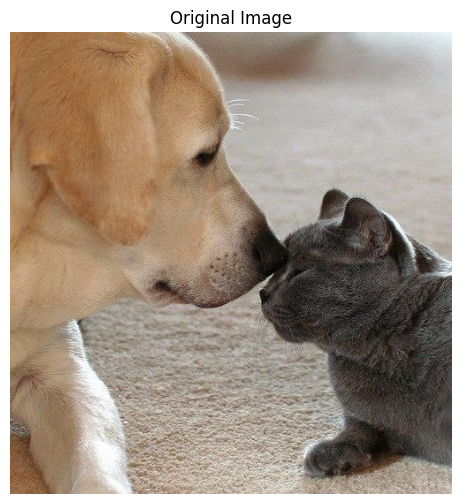

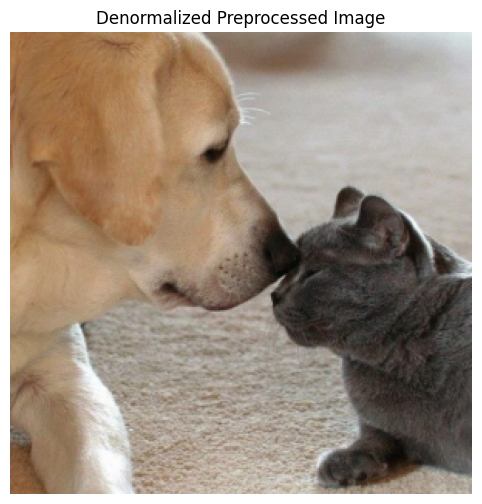

INFO:__main__:Prediction: Labrador retriever: 0.7127
INFO:__main__:Prediction: golden retriever: 0.0191
INFO:__main__:Prediction: Great Pyrenees: 0.0117
INFO:__main__:Prediction: kuvasz: 0.0095
INFO:__main__:Prediction: American Staffordshire terrier: 0.0078
INFO:__main__:Explaining Class: Labrador retriever


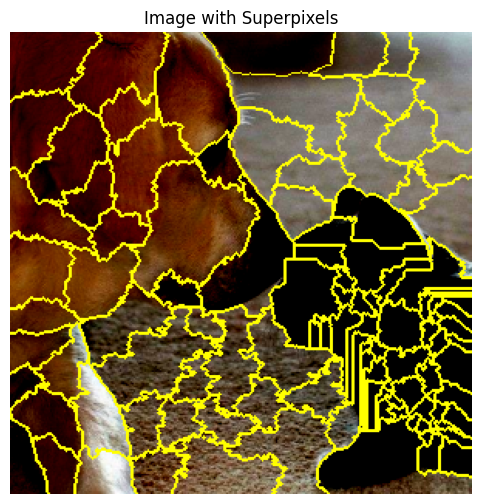

INFO:__main__:Running inference on 150 perturbations...
100%|██████████| 150/150 [03:21<00:00,  1.34s/it]
INFO:__main__:Using LinearRegression for explanation model.


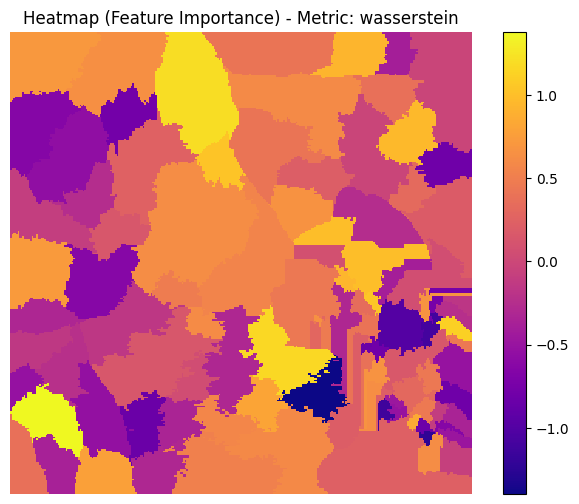

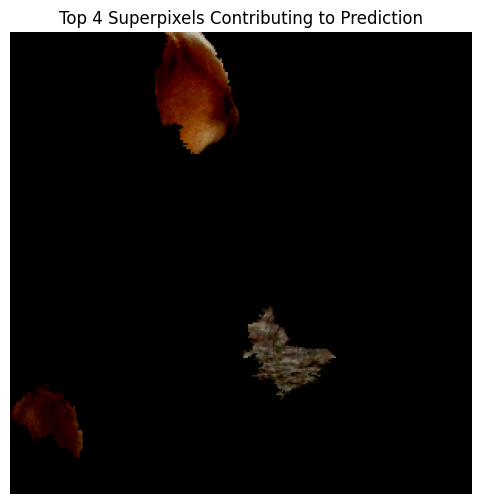

INFO:__main__:Mapping model class 'cat' (ID: 8) to sequential label: 1
INFO:__main__:Mapping model class 'dog' (ID: 12) to sequential label: 2
INFO:__main__:--- Evaluation Metrics ---
INFO:__main__:Coverage with True Label: -0.3379
INFO:__main__:The weighted coverage of the heatmap with the true label is: -0.0100
INFO:__main__:--------------------------


SMILE with Wasserstein Distance Top features: [54 63  7 87]
SMILE with Wasserstein Distance Coverage: -0.3378780366881507
SMILE with Wasserstein Distance Weighted -0.009967517751976475


In [5]:
# 1. Initialize
xwhy_explainer = SmileImageClassification(
    image_path=image_path,
    use_model_preprocess=use_model_preprocess,
    use_embedding_model=use_embedding_model,
    kernel_size=4,
    num_perturb=150,
    distance_metric="wasserstein",  # ["wasserstein", "cosine", "ks", "cramer_von_mises", "anderson_darling", "kuiper"]
    explanation_model="linear_regression",  # ["linear_regression", "bayesian_ridge"]
    num_top_features=4,
    num_top_predictions=5,
)

# 2. Run the entire workflow and get the results
smile_results_wasserstein = xwhy_explainer.run_smile_explanation()

# You can access the results like:
print("SMILE with Wasserstein Distance Top features:", smile_results_wasserstein['top_features'])
print("SMILE with Wasserstein Distance Coverage:", smile_results_wasserstein['coverage'])
print("SMILE with Wasserstein Distance Weighted", smile_results_wasserstein['weighted_coverage'])

<a id="xwhy_ks"></a>
# <div style="padding:20px;color:white;margin:0;font-size:20px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><b>Defining XWhy with Kolmogorov Smirnov Distance</b></div>

INFO:__main__:Initialized with Distance Metric: ks
INFO:__main__:Setting seeds for reproducibility...
INFO:__main__:Setup Facebook DINOv2 processor & model...
INFO:__main__:Loading DeepLabV3+ segmentation model...
INFO:__main__:Segmentation model classes: ['__background__', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor']


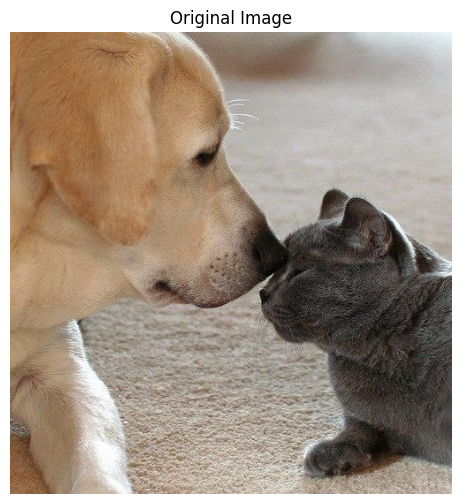

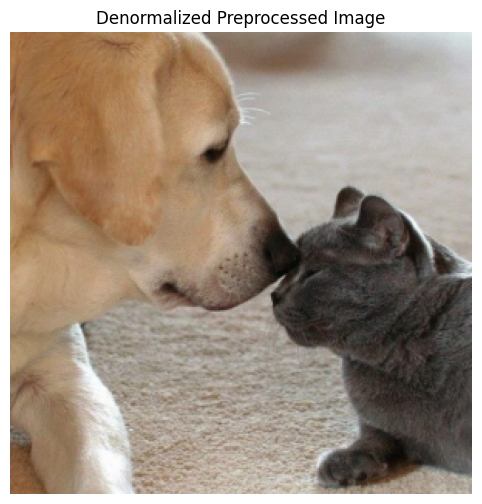

INFO:__main__:Prediction: Labrador retriever: 0.7127
INFO:__main__:Prediction: golden retriever: 0.0191
INFO:__main__:Prediction: Great Pyrenees: 0.0117
INFO:__main__:Prediction: kuvasz: 0.0095
INFO:__main__:Prediction: American Staffordshire terrier: 0.0078
INFO:__main__:Explaining Class: Labrador retriever


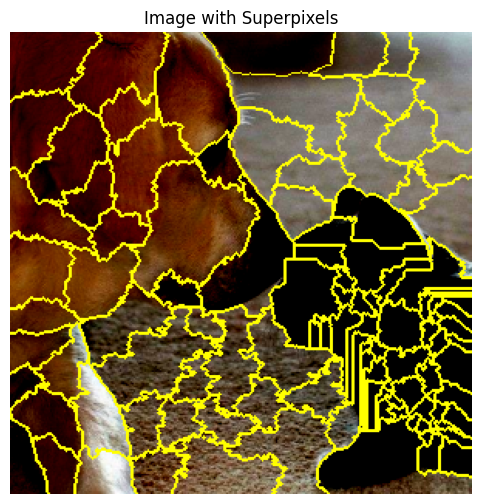

INFO:__main__:Running inference on 150 perturbations...
100%|██████████| 150/150 [03:02<00:00,  1.22s/it]
INFO:__main__:Using LinearRegression for explanation model.


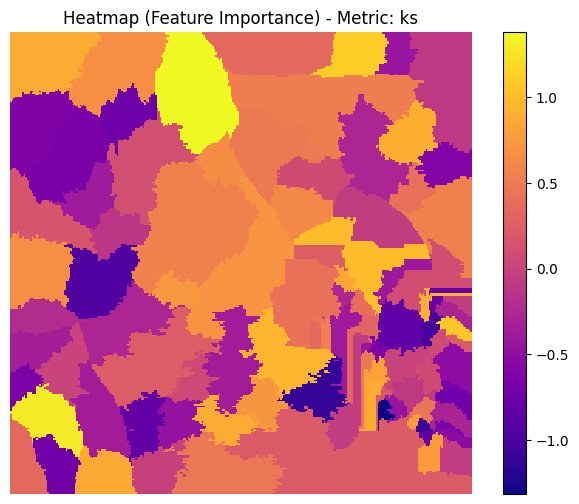

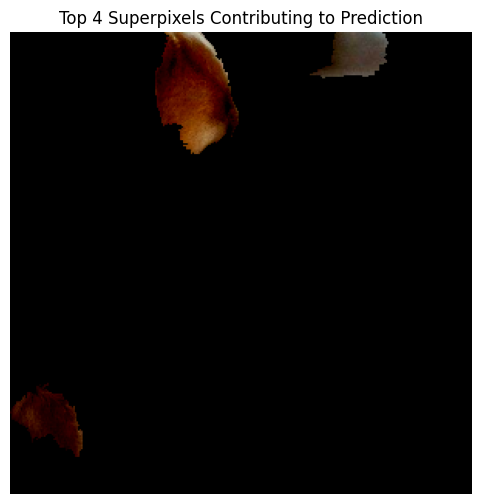

INFO:__main__:Mapping model class 'cat' (ID: 8) to sequential label: 1
INFO:__main__:Mapping model class 'dog' (ID: 12) to sequential label: 2
INFO:__main__:--- Evaluation Metrics ---
INFO:__main__:Coverage with True Label: -0.3379
INFO:__main__:The weighted coverage of the heatmap with the true label is: -0.0089
INFO:__main__:--------------------------


SMILE with Kolmogorov Smirnov Distance Top features: [54  1 87  7]
SMILE with Kolmogorov Smirnov Distance Coverage: -0.3378780366881507
SMILE with Kolmogorov Smirnov Distance Weighted -0.008925242888006642


In [6]:
# 1. Initialize
xwhy_explainer = SmileImageClassification(
    image_path=image_path,
    use_model_preprocess=use_model_preprocess,
    use_embedding_model=use_embedding_model,
    kernel_size=4,
    num_perturb=150,
    distance_metric="ks",  # ["wasserstein", "cosine", "ks", "cramer_von_mises", "anderson_darling", "kuiper"]
    explanation_model="linear_regression",  # ["linear_regression", "bayesian_ridge"]
    num_top_features=4,
    num_top_predictions=5,
)

# 2. Run the entire workflow and get the results
smile_results_ks = xwhy_explainer.run_smile_explanation()

# You can access the results like:
print("SMILE with Kolmogorov Smirnov Distance Top features:", smile_results_ks['top_features'])
print("SMILE with Kolmogorov Smirnov Distance Coverage:", smile_results_ks['coverage'])
print("SMILE with Kolmogorov Smirnov Distance Weighted", smile_results_ks['weighted_coverage'])

<a id="xwhy_cvm"></a>
# <div style="padding:20px;color:white;margin:0;font-size:20px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><b>Defining XWhy with Cramer-Von Mises Distance</b></div>

INFO:__main__:Initialized with Distance Metric: cramer_von_mises
INFO:__main__:Setting seeds for reproducibility...
INFO:__main__:Setup Facebook DINOv2 processor & model...
INFO:__main__:Loading DeepLabV3+ segmentation model...
INFO:__main__:Segmentation model classes: ['__background__', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor']


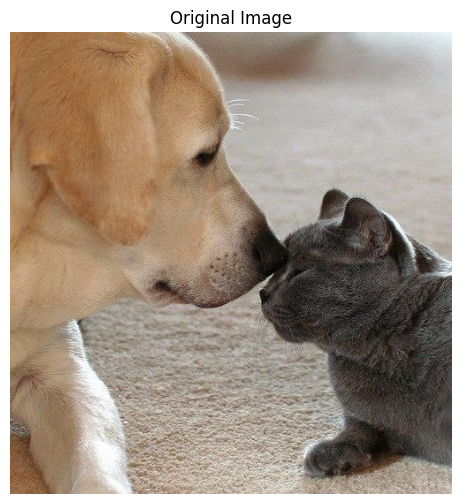

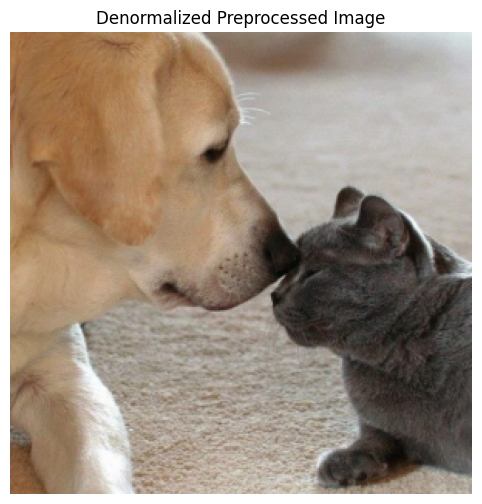

INFO:__main__:Prediction: Labrador retriever: 0.7127
INFO:__main__:Prediction: golden retriever: 0.0191
INFO:__main__:Prediction: Great Pyrenees: 0.0117
INFO:__main__:Prediction: kuvasz: 0.0095
INFO:__main__:Prediction: American Staffordshire terrier: 0.0078
INFO:__main__:Explaining Class: Labrador retriever


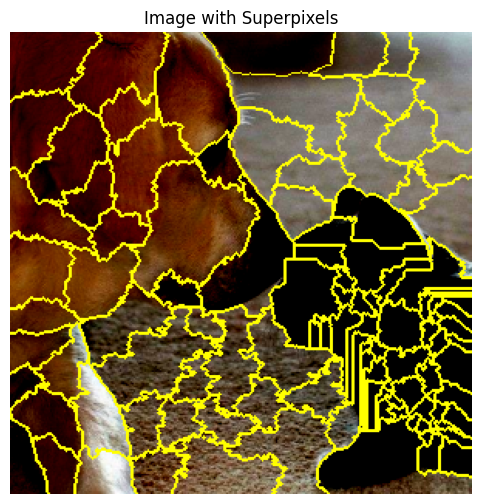

INFO:__main__:Running inference on 150 perturbations...
100%|██████████| 150/150 [03:07<00:00,  1.25s/it]
INFO:__main__:Using LinearRegression for explanation model.


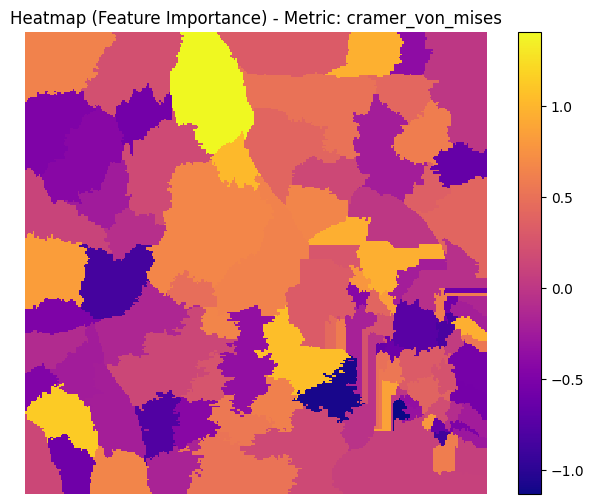

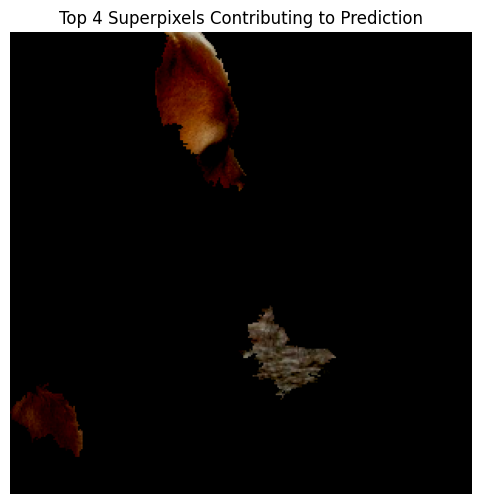

INFO:__main__:Mapping model class 'cat' (ID: 8) to sequential label: 1
INFO:__main__:Mapping model class 'dog' (ID: 12) to sequential label: 2
INFO:__main__:--- Evaluation Metrics ---
INFO:__main__:Coverage with True Label: -0.3738
INFO:__main__:The weighted coverage of the heatmap with the true label is: -0.0103
INFO:__main__:--------------------------


SMILE with Cramer-Von Mises Distance Top features: [16 63 87  7]
SMILE with Cramer-Von Mises Distance Coverage: -0.3738225086762519
SMILE with Cramer-Von Mises Distance Weighted -0.010271531068975097


In [7]:
# 1. Initialize
xwhy_explainer = SmileImageClassification(
    image_path=image_path,
    use_model_preprocess=use_model_preprocess,
    use_embedding_model=use_embedding_model,
    kernel_size=4,
    num_perturb=150,
    distance_metric="cramer_von_mises",  # ["wasserstein", "cosine", "ks", "cramer_von_mises", "anderson_darling", "kuiper"]
    explanation_model="linear_regression",  # ["linear_regression", "bayesian_ridge"]
    num_top_features=4,
    num_top_predictions=5,
)

# 2. Run the entire workflow and get the results
smile_results_cvm = xwhy_explainer.run_smile_explanation()

# You can access the results like:
print("SMILE with Cramer-Von Mises Distance Top features:", smile_results_cvm['top_features'])
print("SMILE with Cramer-Von Mises Distance Coverage:", smile_results_cvm['coverage'])
print("SMILE with Cramer-Von Mises Distance Weighted", smile_results_cvm['weighted_coverage'])

<a id="xwhy_ad"></a>
# <div style="padding:20px;color:white;margin:0;font-size:20px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><b>Defining XWhy with Anderson Darling Distance</b></div>

INFO:__main__:Initialized with Distance Metric: anderson_darling
INFO:__main__:Setting seeds for reproducibility...
INFO:__main__:Setup Facebook DINOv2 processor & model...
INFO:__main__:Loading DeepLabV3+ segmentation model...
INFO:__main__:Segmentation model classes: ['__background__', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor']


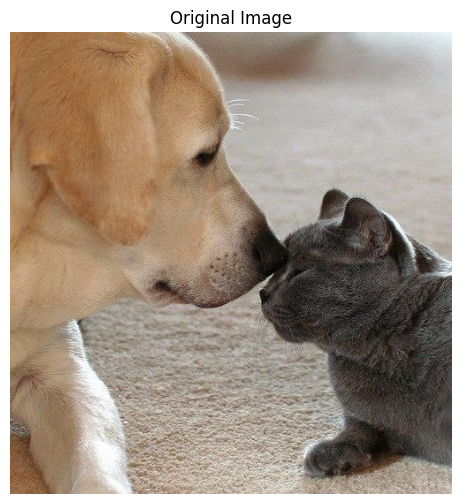

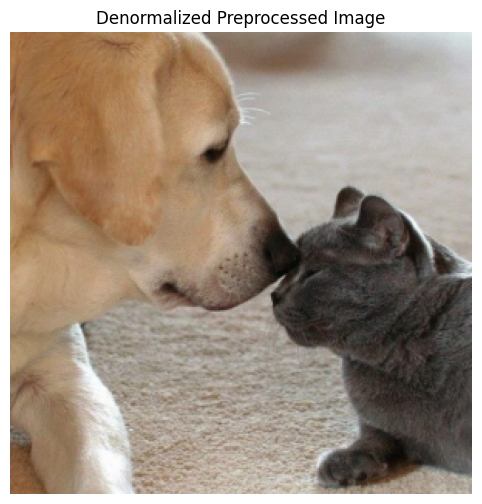

INFO:__main__:Prediction: Labrador retriever: 0.7127
INFO:__main__:Prediction: golden retriever: 0.0191
INFO:__main__:Prediction: Great Pyrenees: 0.0117
INFO:__main__:Prediction: kuvasz: 0.0095
INFO:__main__:Prediction: American Staffordshire terrier: 0.0078
INFO:__main__:Explaining Class: Labrador retriever


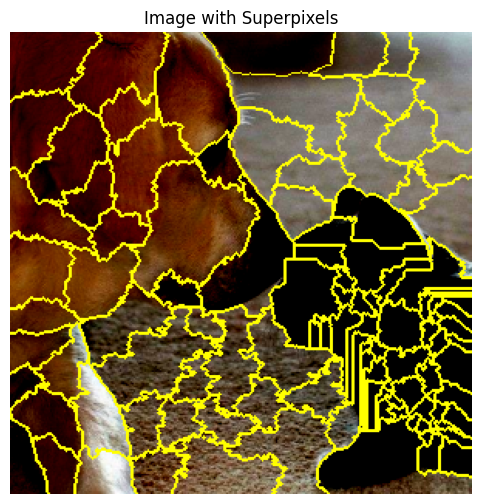

INFO:__main__:Running inference on 150 perturbations...
  1%|          | 1/150 [00:01<03:05,  1.25s/it]/tmp/ipython-input-3843217859.py:908: UserWarning: p-value capped: true value larger than 0.25. Consider specifying `method` (e.g. `method=stats.PermutationMethod()`.)
  return anderson_ksamp([a, b])
  2%|▏         | 3/150 [00:03<03:00,  1.23s/it]/tmp/ipython-input-3843217859.py:908: UserWarning: p-value floored: true value smaller than 0.001. Consider specifying `method` (e.g. `method=stats.PermutationMethod()`.)
  return anderson_ksamp([a, b])
100%|██████████| 150/150 [03:16<00:00,  1.31s/it]
INFO:__main__:Using LinearRegression for explanation model.


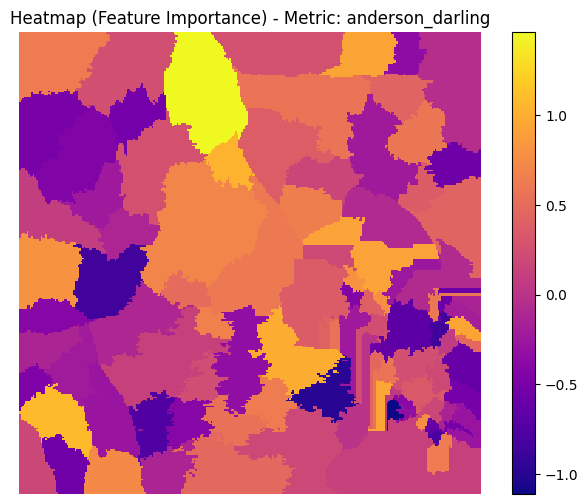

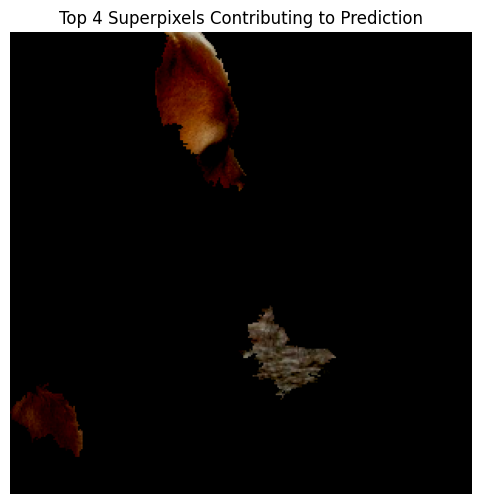

INFO:__main__:Mapping model class 'cat' (ID: 8) to sequential label: 1
INFO:__main__:Mapping model class 'dog' (ID: 12) to sequential label: 2
INFO:__main__:--- Evaluation Metrics ---
INFO:__main__:Coverage with True Label: -0.3738
INFO:__main__:The weighted coverage of the heatmap with the true label is: -0.0103
INFO:__main__:--------------------------


SMILE with Anderson Darling Distance Top features: [63 16 87  7]
SMILE with Anderson Darling Distance Coverage: -0.3738225086762519
SMILE with Anderson Darling Distance Weighted -0.010271531068975097


In [8]:
# 1. Initialize
xwhy_explainer = SmileImageClassification(
    image_path=image_path,
    use_model_preprocess=use_model_preprocess,
    use_embedding_model=use_embedding_model,
    kernel_size=4,
    num_perturb=150,
    distance_metric="anderson_darling",  # ["wasserstein", "cosine", "ks", "cramer_von_mises", "anderson_darling", "kuiper"]
    explanation_model="linear_regression",  # ["linear_regression", "bayesian_ridge"]
    num_top_features=4,
    num_top_predictions=5,
)

# 2. Run the entire workflow and get the results
smile_results_ad = xwhy_explainer.run_smile_explanation()

# You can access the results like:
print("SMILE with Anderson Darling Distance Top features:", smile_results_ad['top_features'])
print("SMILE with Anderson Darling Distance Coverage:", smile_results_ad['coverage'])
print("SMILE with Anderson Darling Distance Weighted", smile_results_ad['weighted_coverage'])

<a id="xwhy_ku"></a>
# <div style="padding:20px;color:white;margin:0;font-size:20px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><b>Defining XWhy with Kuiper Distance</b></div>

INFO:__main__:Initialized with Distance Metric: kuiper
INFO:__main__:Setting seeds for reproducibility...
INFO:__main__:Setup Facebook DINOv2 processor & model...
INFO:__main__:Loading DeepLabV3+ segmentation model...
INFO:__main__:Segmentation model classes: ['__background__', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor']


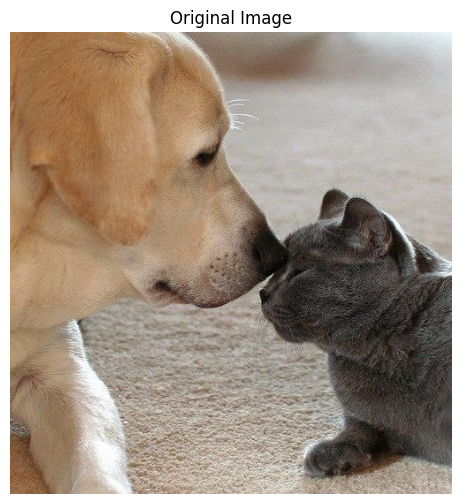

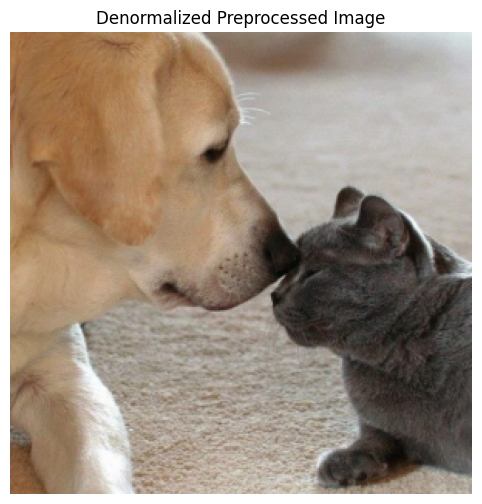

INFO:__main__:Prediction: Labrador retriever: 0.7127
INFO:__main__:Prediction: golden retriever: 0.0191
INFO:__main__:Prediction: Great Pyrenees: 0.0117
INFO:__main__:Prediction: kuvasz: 0.0095
INFO:__main__:Prediction: American Staffordshire terrier: 0.0078
INFO:__main__:Explaining Class: Labrador retriever


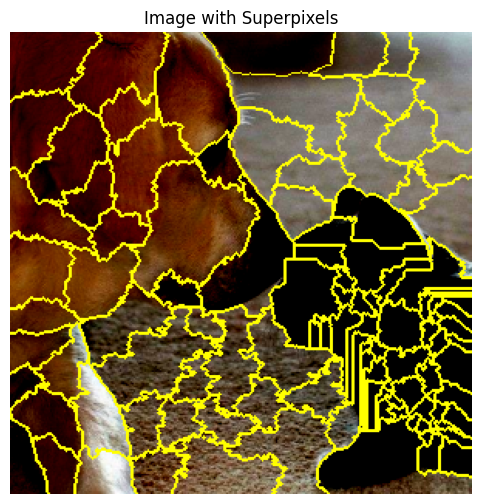

INFO:__main__:Running inference on 150 perturbations...
100%|██████████| 150/150 [03:38<00:00,  1.45s/it]
INFO:__main__:Using LinearRegression for explanation model.


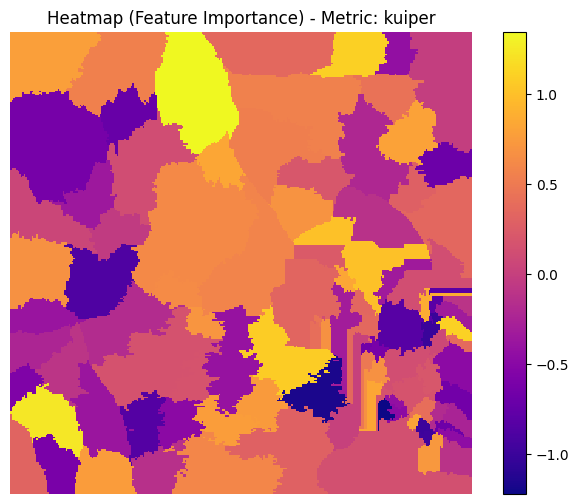

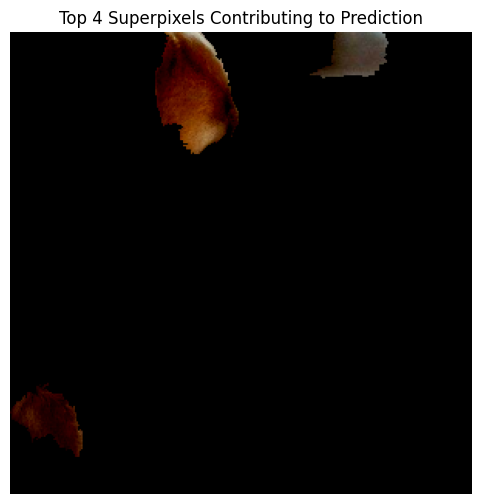

INFO:__main__:Mapping model class 'cat' (ID: 8) to sequential label: 1
INFO:__main__:Mapping model class 'dog' (ID: 12) to sequential label: 2
INFO:__main__:--- Evaluation Metrics ---
INFO:__main__:Coverage with True Label: -0.3379
INFO:__main__:The weighted coverage of the heatmap with the true label is: -0.0089
INFO:__main__:--------------------------


SMILE with Kuiper Distance Top features: [ 1 54 87  7]
SMILE with Kuiper Distance Coverage: -0.3378780366881507
SMILE with Kuiper Distance Weighted -0.008925242888006642


In [9]:
# 1. Initialize
xwhy_explainer = SmileImageClassification(
    image_path=image_path,
    use_model_preprocess=use_model_preprocess,
    use_embedding_model=use_embedding_model,
    kernel_size=4,
    num_perturb=150,
    distance_metric="kuiper",  # ["wasserstein", "cosine", "ks", "cramer_von_mises", "anderson_darling", "kuiper"]
    explanation_model="linear_regression",  # ["linear_regression", "bayesian_ridge"]
    num_top_features=4,
    num_top_predictions=5,
)

# 2. Run the entire workflow and get the results
smile_results_ku = xwhy_explainer.run_smile_explanation()

# You can access the results like:
print("SMILE with Kuiper Distance Top features:", smile_results_ku['top_features'])
print("SMILE with Kuiper Distance Coverage:", smile_results_ku['coverage'])
print("SMILE with Kuiper Distance Weighted", smile_results_ku['weighted_coverage'])

<a id="lime"></a>
# <div style="padding:20px;color:white;margin:0;font-size:20px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><b>Define LIME</b></div>

INFO:__main__:Initialized with Distance Metric: cosine
INFO:__main__:Loading DeepLabV3+ segmentation model...
INFO:__main__:Segmentation model classes: ['__background__', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor']


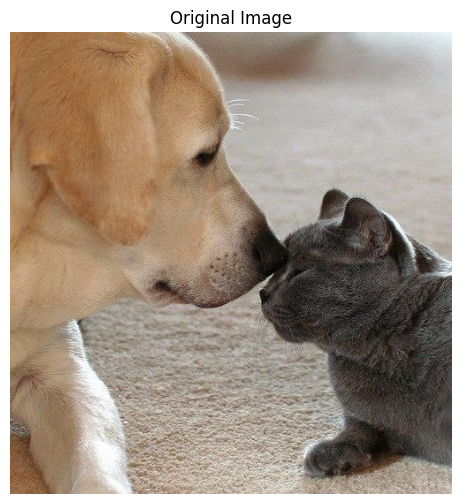

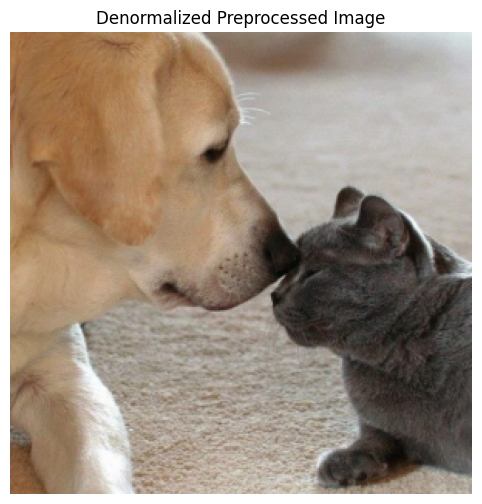

INFO:__main__:Prediction: Labrador retriever: 0.7127
INFO:__main__:Prediction: golden retriever: 0.0191
INFO:__main__:Prediction: Great Pyrenees: 0.0117
INFO:__main__:Prediction: kuvasz: 0.0095
INFO:__main__:Prediction: American Staffordshire terrier: 0.0078
INFO:__main__:Explaining Class: Labrador retriever


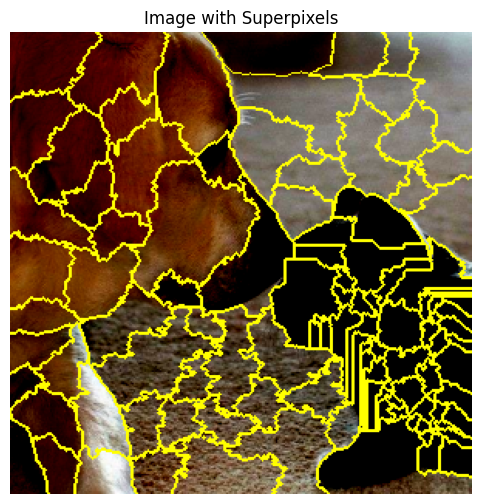

INFO:__main__:Running inference on 150 perturbations...
100%|██████████| 150/150 [00:57<00:00,  2.59it/s]
INFO:__main__:Using LinearRegression for explanation model.


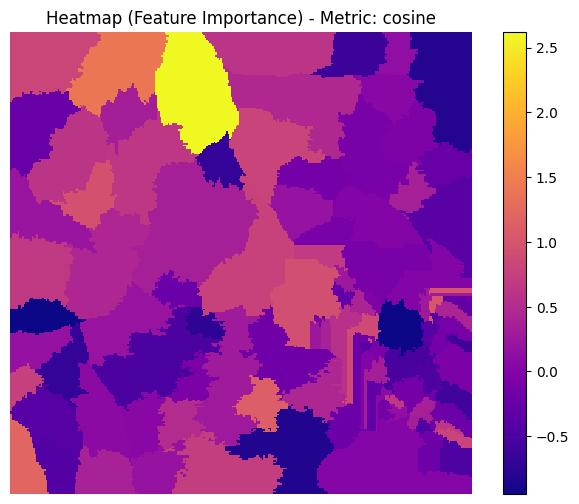

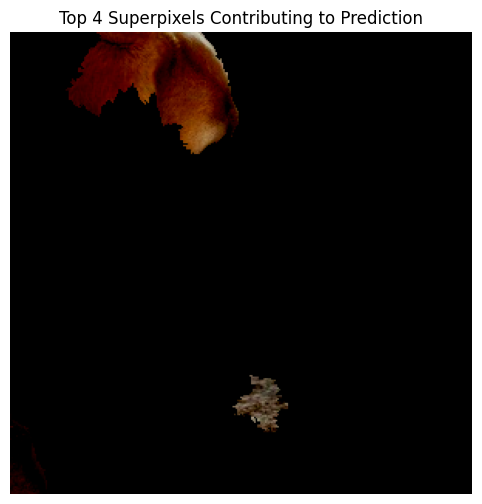

INFO:__main__:Mapping model class 'cat' (ID: 8) to sequential label: 1
INFO:__main__:Mapping model class 'dog' (ID: 12) to sequential label: 2
INFO:__main__:--- Evaluation Metrics ---
INFO:__main__:Coverage with True Label: -0.4331
INFO:__main__:The weighted coverage of the heatmap with the true label is: -0.0106
INFO:__main__:--------------------------


LIME Top features: [ 78 100   4   7]
LIME Coverage: -0.433068914229053
LIME Weighted -0.010638636413724813


In [10]:
# 1. Initialize
lime_explainer = SmileImageClassification(
    image_path=image_path,
    use_model_preprocess=use_model_preprocess,
    use_embedding_model=False,
    kernel_size=4,
    num_perturb=150,
    distance_metric="cosine",  # ["wasserstein", "cosine", "ks", "cramer_von_mises", "anderson_darling", "kuiper"]
    explanation_model="linear_regression",  # ["linear_regression", "bayesian_ridge"]
    num_top_features=4,
    num_top_predictions=5,
)

# 2. Run the entire workflow and get the results
lime_results = lime_explainer.run_smile_explanation()

# You can access the results like:
print("LIME Top features:", lime_results['top_features'])
print("LIME Coverage:", lime_results['coverage'])
print("LIME Weighted", lime_results['weighted_coverage'])

<a id="lime_emb"></a>
# <div style="padding:20px;color:white;margin:0;font-size:20px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><b>Define LIME with embedding</b></div>

INFO:__main__:Initialized with Distance Metric: cosine
INFO:__main__:Setting seeds for reproducibility...
INFO:__main__:Setup Facebook DINOv2 processor & model...
INFO:__main__:Loading DeepLabV3+ segmentation model...
INFO:__main__:Segmentation model classes: ['__background__', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor']


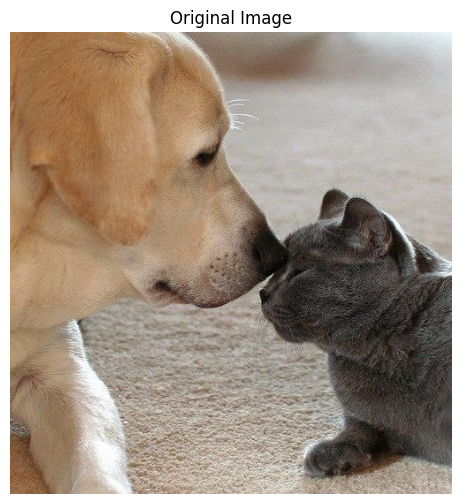

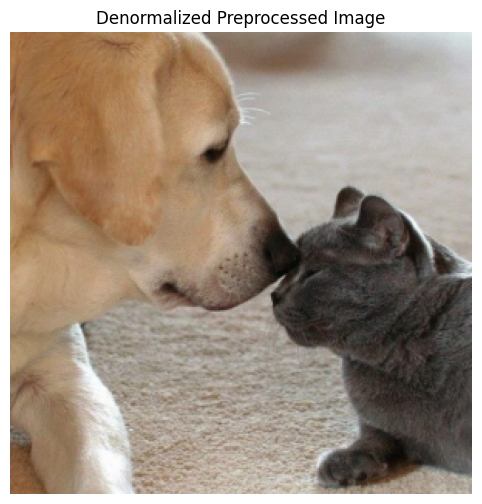

INFO:__main__:Prediction: Labrador retriever: 0.7127
INFO:__main__:Prediction: golden retriever: 0.0191
INFO:__main__:Prediction: Great Pyrenees: 0.0117
INFO:__main__:Prediction: kuvasz: 0.0095
INFO:__main__:Prediction: American Staffordshire terrier: 0.0078
INFO:__main__:Explaining Class: Labrador retriever


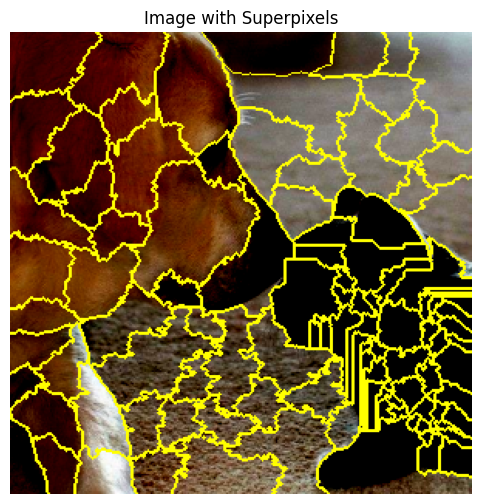

INFO:__main__:Running inference on 150 perturbations...
100%|██████████| 150/150 [03:17<00:00,  1.31s/it]
INFO:__main__:Using LinearRegression for explanation model.


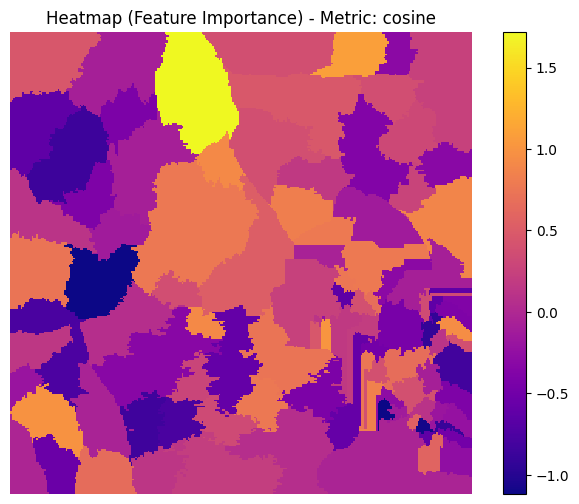

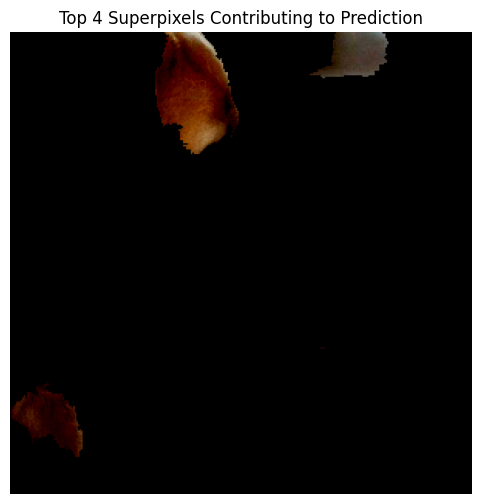

INFO:__main__:Mapping model class 'cat' (ID: 8) to sequential label: 1
INFO:__main__:Mapping model class 'dog' (ID: 12) to sequential label: 2
INFO:__main__:--- Evaluation Metrics ---
INFO:__main__:Coverage with True Label: -0.3379
INFO:__main__:The weighted coverage of the heatmap with the true label is: -0.0089
INFO:__main__:--------------------------


LIME Embedding Top features: [87 49  1  7]
LIME Embedding Coverage: -0.3378780366881507
LIME Embedding Weighted -0.00892695362218376


In [11]:
# 1. Initialize
lime_embedding_explainer = SmileImageClassification(
    image_path=image_path,
    use_model_preprocess=use_model_preprocess,
    use_embedding_model=True,
    kernel_size=4,
    num_perturb=150,
    distance_metric="cosine",  # ["wasserstein", "cosine", "ks", "cramer_von_mises", "anderson_darling", "kuiper"]
    explanation_model="linear_regression",  # ["linear_regression", "bayesian_ridge"]
    num_top_features=4,
    num_top_predictions=5,
)

# 2. Run the entire workflow and get the results
lime_embedding_results = lime_embedding_explainer.run_smile_explanation()

# You can access the results like:
print("LIME Embedding Top features:", lime_embedding_results['top_features'])
print("LIME Embedding Coverage:", lime_embedding_results['coverage'])
print("LIME Embedding Weighted", lime_embedding_results['weighted_coverage'])

<a id="abylime"></a>
# <div style="padding:20px;color:white;margin:0;font-size:20px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><b>Define BayLIME</b></div>

INFO:__main__:Initialized with Distance Metric: cosine
INFO:__main__:Loading DeepLabV3+ segmentation model...
INFO:__main__:Segmentation model classes: ['__background__', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor']


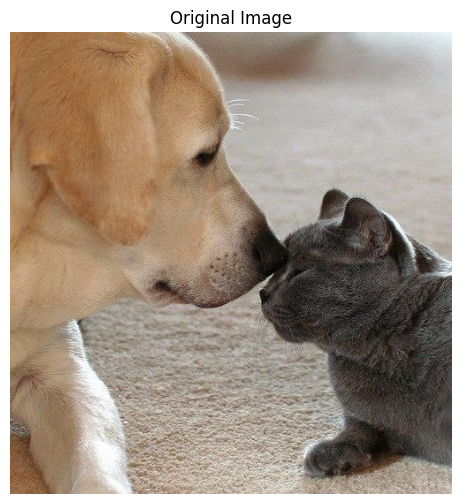

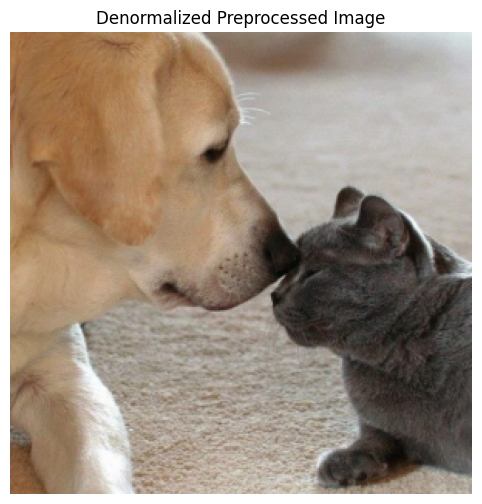

INFO:__main__:Prediction: Labrador retriever: 0.7127
INFO:__main__:Prediction: golden retriever: 0.0191
INFO:__main__:Prediction: Great Pyrenees: 0.0117
INFO:__main__:Prediction: kuvasz: 0.0095
INFO:__main__:Prediction: American Staffordshire terrier: 0.0078
INFO:__main__:Explaining Class: Labrador retriever


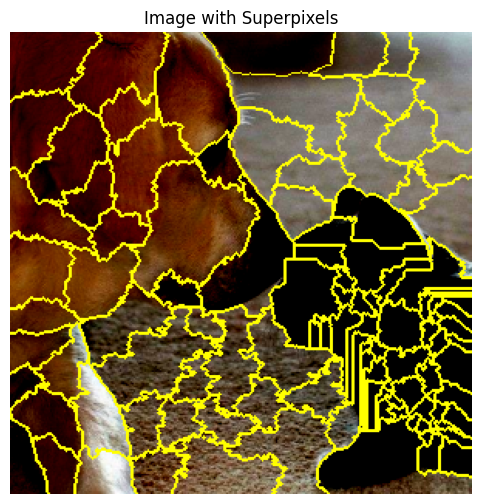

INFO:__main__:Running inference on 150 perturbations...
100%|██████████| 150/150 [00:57<00:00,  2.60it/s]
INFO:__main__:Using BayesianRidge for explanation model.


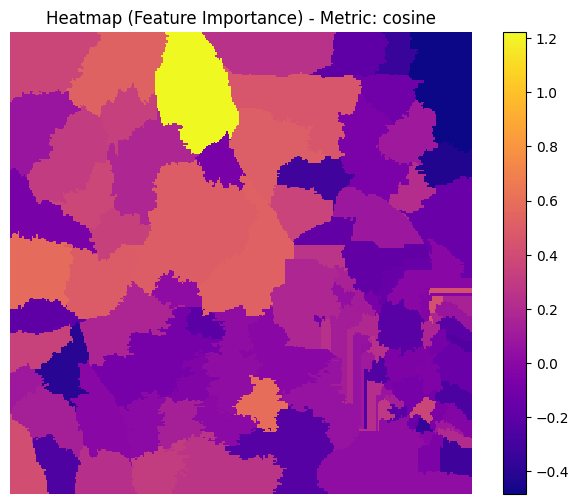

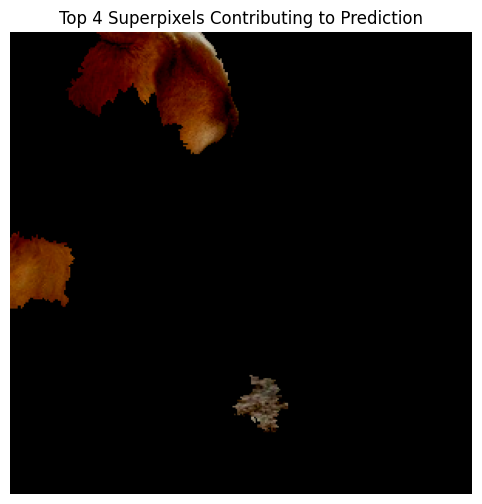

INFO:__main__:Mapping model class 'cat' (ID: 8) to sequential label: 1
INFO:__main__:Mapping model class 'dog' (ID: 12) to sequential label: 2
INFO:__main__:--- Evaluation Metrics ---
INFO:__main__:Coverage with True Label: -0.5528
INFO:__main__:The weighted coverage of the heatmap with the true label is: -0.0142
INFO:__main__:--------------------------


BayLIME Top features: [ 4 29 78  7]
BayLIME Coverage: -0.5528011898859693
BayLIME Weighted -0.014229098337526716


In [12]:
# 1. Initialize
baylime_explainer = SmileImageClassification(
    image_path=image_path,
    use_model_preprocess=use_model_preprocess,
    use_embedding_model=False,
    kernel_size=4,
    num_perturb=150,
    distance_metric="cosine",  # ["wasserstein", "cosine", "ks", "cramer_von_mises", "anderson_darling", "kuiper"]
    explanation_model="bayesian_ridge",  # ["linear_regression", "bayesian_ridge"]
    num_top_features=4,
    num_top_predictions=5,
)

# 2. Run the entire workflow and get the results
baylime_results = baylime_explainer.run_smile_explanation()

# You can access the results like:
print("BayLIME Top features:", baylime_results['top_features'])
print("BayLIME Coverage:", baylime_results['coverage'])
print("BayLIME Weighted", baylime_results['weighted_coverage'])

<a id="baylime_emb"></a>
# <div style="padding:20px;color:white;margin:0;font-size:20px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><b>Define BayLIME with embedding</b></div>

INFO:__main__:Initialized with Distance Metric: cosine
INFO:__main__:Setting seeds for reproducibility...
INFO:__main__:Setup Facebook DINOv2 processor & model...
INFO:__main__:Loading DeepLabV3+ segmentation model...
INFO:__main__:Segmentation model classes: ['__background__', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor']


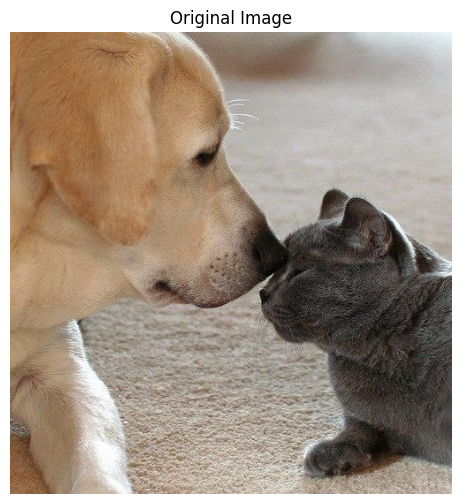

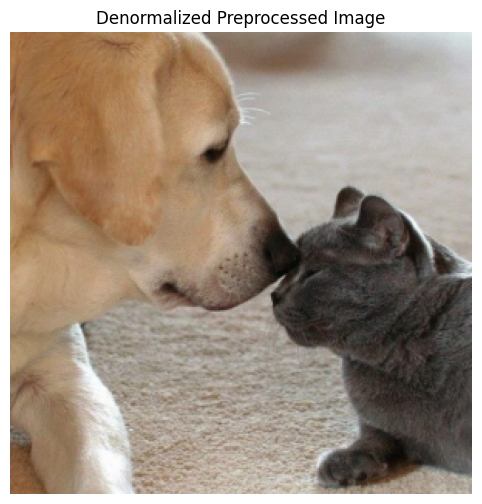

INFO:__main__:Prediction: Labrador retriever: 0.7127
INFO:__main__:Prediction: golden retriever: 0.0191
INFO:__main__:Prediction: Great Pyrenees: 0.0117
INFO:__main__:Prediction: kuvasz: 0.0095
INFO:__main__:Prediction: American Staffordshire terrier: 0.0078
INFO:__main__:Explaining Class: Labrador retriever


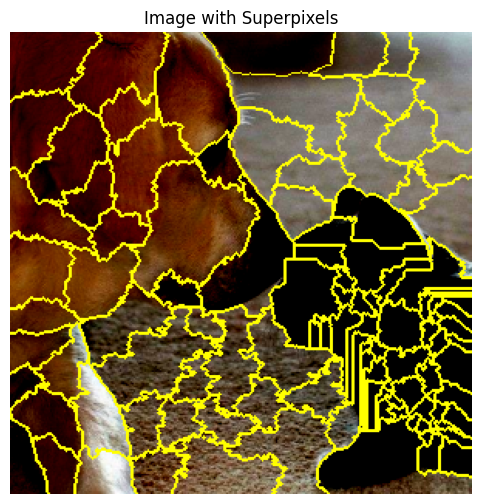

INFO:__main__:Running inference on 150 perturbations...
100%|██████████| 150/150 [03:29<00:00,  1.40s/it]
INFO:__main__:Using BayesianRidge for explanation model.


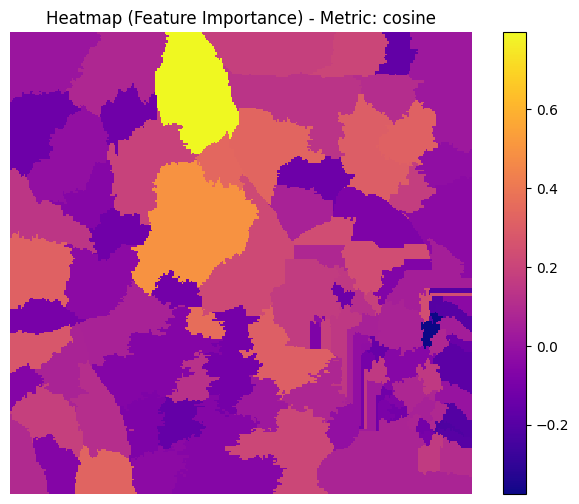

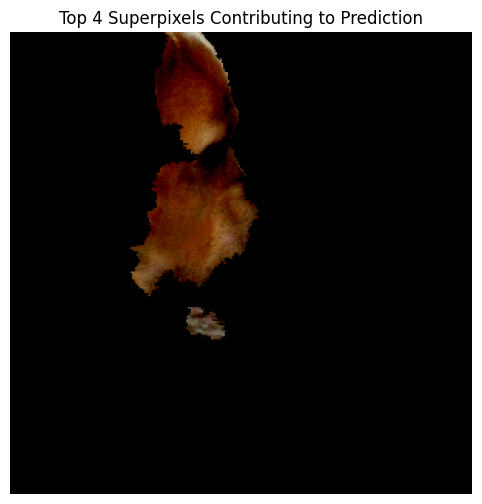

INFO:__main__:Mapping model class 'cat' (ID: 8) to sequential label: 1
INFO:__main__:Mapping model class 'dog' (ID: 12) to sequential label: 2
INFO:__main__:--- Evaluation Metrics ---
INFO:__main__:Coverage with True Label: -0.6317
INFO:__main__:The weighted coverage of the heatmap with the true label is: -0.0157
INFO:__main__:--------------------------


BayLIME Embedding Top features: [16 52 24  7]
BayLIME Embedding Coverage: -0.6317137663196166
BayLIME Embedding Weighted -0.0157289578392003


In [13]:
# 1. Initialize
baylime_embedding_explainer = SmileImageClassification(
    image_path=image_path,
    use_model_preprocess=use_model_preprocess,
    use_embedding_model=True,
    kernel_size=4,
    num_perturb=150,
    distance_metric="cosine",  # ["wasserstein", "cosine", "ks", "cramer_von_mises", "anderson_darling", "kuiper"]
    explanation_model="bayesian_ridge",  # ["linear_regression", "bayesian_ridge"]
    num_top_features=4,
    num_top_predictions=5,
)

# 2. Run the entire workflow and get the results
baylime_embedding_results = baylime_embedding_explainer.run_smile_explanation()

# You can access the results like:
print("BayLIME Embedding Top features:", baylime_embedding_results['top_features'])
print("BayLIME Embedding Coverage:", baylime_embedding_results['coverage'])
print("BayLIME Embedding Weighted", baylime_embedding_results['weighted_coverage'])

<a id="shap"></a>
# <div style="padding:20px;color:white;margin:0;font-size:20px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><b>Define Kernel SHAP</b></div>

INFO:__main__:Initialized with Distance Metric: wasserstein
INFO:__main__:Loading DeepLabV3+ segmentation model...
INFO:__main__:Segmentation model classes: ['__background__', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor']
INFO:__main__:Starting Kernel SHAP Explanation...


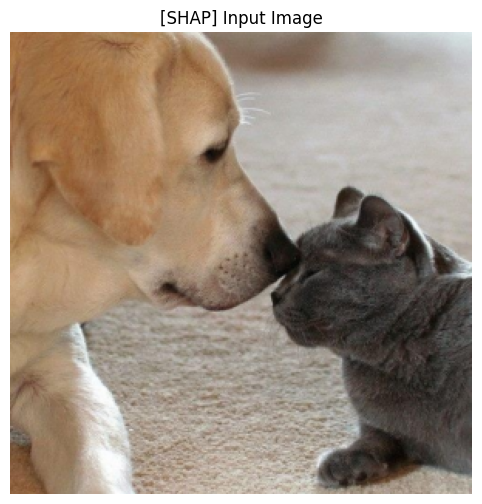

INFO:__main__:[SHAP] Explaining Class: Labrador retriever
INFO:__main__:Running inference on 150 perturbations...
100%|██████████| 150/150 [01:12<00:00,  2.07it/s]


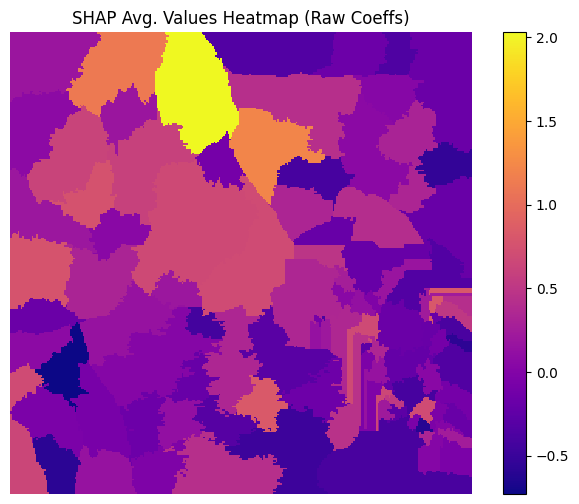

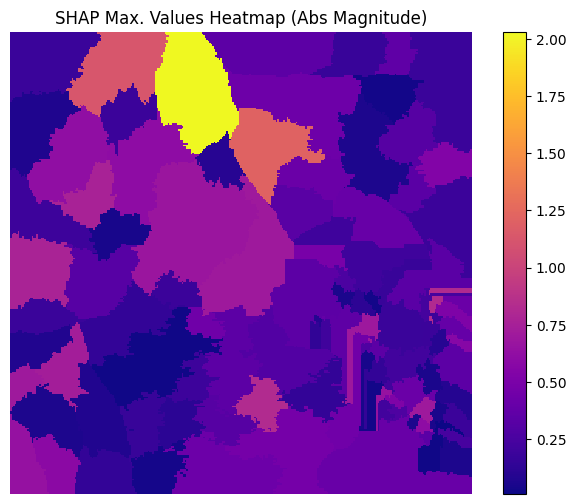

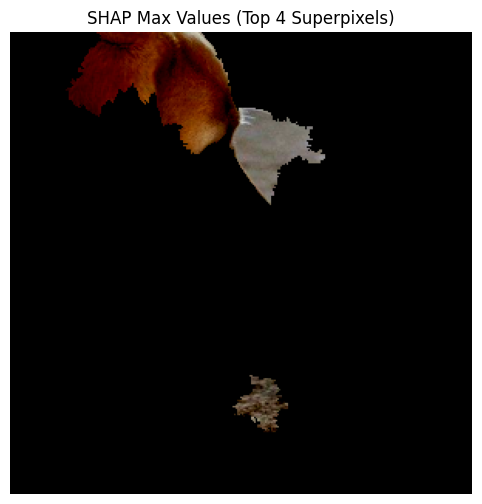

INFO:__main__:Mapping model class 'cat' (ID: 8) to sequential label: 1
INFO:__main__:Mapping model class 'dog' (ID: 12) to sequential label: 2
INFO:__main__:--- SHAP Evaluation Metrics ---
INFO:__main__:SHAP Coverage (Max Values Top K): -0.4308
INFO:__main__:SHAP Weighted Coverage: -0.0201
INFO:__main__:-------------------------------


SHAP Top features: [78  4 12  7]
SHAP Coverage: -0.43083787803668816
SHAP Weighted -0.020082946602885884


In [14]:
shap_explainer = SmileImageClassification(
    image_path=image_path,
    use_model_preprocess=use_model_preprocess,
    use_embedding_model=False,
    num_perturb=150,
    num_top_features=4,
    num_top_predictions=5,
)

shap_results = shap_explainer.run_shap_explanation()

# Access results
print("SHAP Top features:", shap_results['top_features'])
print("SHAP Coverage:", shap_results['coverage'])
print("SHAP Weighted", shap_results['weighted_coverage'])

<a id="comparative"></a>
# <div style="padding:20px;color:white;margin:0;font-size:20px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><b>Comparative coverage of all methods</b></div>

In [17]:
# 1. Gather all results and metadata into a single list
all_results = [
    ('SMILE', 'Wasserstein', smile_results_wasserstein),
    ('SMILE', 'Kolmogorov Smirnov', smile_results_ks),
    ('SMILE', 'Cramer-Von Mises', smile_results_cvm),
    ('SMILE', 'Anderson Darling', smile_results_ad),
    ('SMILE', 'Kuiper', smile_results_ku),
    ('LIME', 'Cosine', lime_results),
    ('LIME with embedding', 'Cosine', lime_embedding_results),
    ('BAYLIME', 'Cosine', baylime_results),
    ('BAYLIME with embedding', 'Cosine', baylime_embedding_results),
    ('SHAP', 'Shap kernel', shap_results),
]

# 2. Run the comparison table
comparison_df = SmileImageClassification.compare_explanations(all_results)

--- Best Simple Coverage Method ---
| Method   | Distance    |   Simple Coverage |   Weighted Coverage |
|:---------|:------------|------------------:|--------------------:|
| SMILE    | Wasserstein |         -0.337878 |         -0.00996752 |

--- Best Weighted Coverage Method ---
| Method   | Distance           |   Simple Coverage |   Weighted Coverage |
|:---------|:-------------------|------------------:|--------------------:|
| SMILE    | Kolmogorov Smirnov |         -0.337878 |         -0.00892524 |


In [18]:
comparison_df

,Method,Distance,Simple Coverage,Weighted Coverage
0,SMILE,Wasserstein,-0.337878,-0.009968
1,SMILE,Kolmogorov Smirnov,-0.337878,-0.008925
2,SMILE,Cramer-Von Mises,-0.373823,-0.010272
3,SMILE,Anderson Darling,-0.373823,-0.010272
4,SMILE,Kuiper,-0.337878,-0.008925
5,LIME,Cosine,-0.433069,-0.010639
6,LIME with embedding,Cosine,-0.337878,-0.008927
7,BAYLIME,Cosine,-0.552801,-0.014229
8,BAYLIME with embedding,Cosine,-0.631714,-0.015729
9,SHAP,Max kernel,-0.430838,-0.020083


<a id="comparative_heatmaps"></a>
# <div style="padding:20px;color:white;margin:0;font-size:20px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><b>Comparison of heat maps of all methods</b></div>

Figure saved successfully to /content/all_explanations_comparison.png


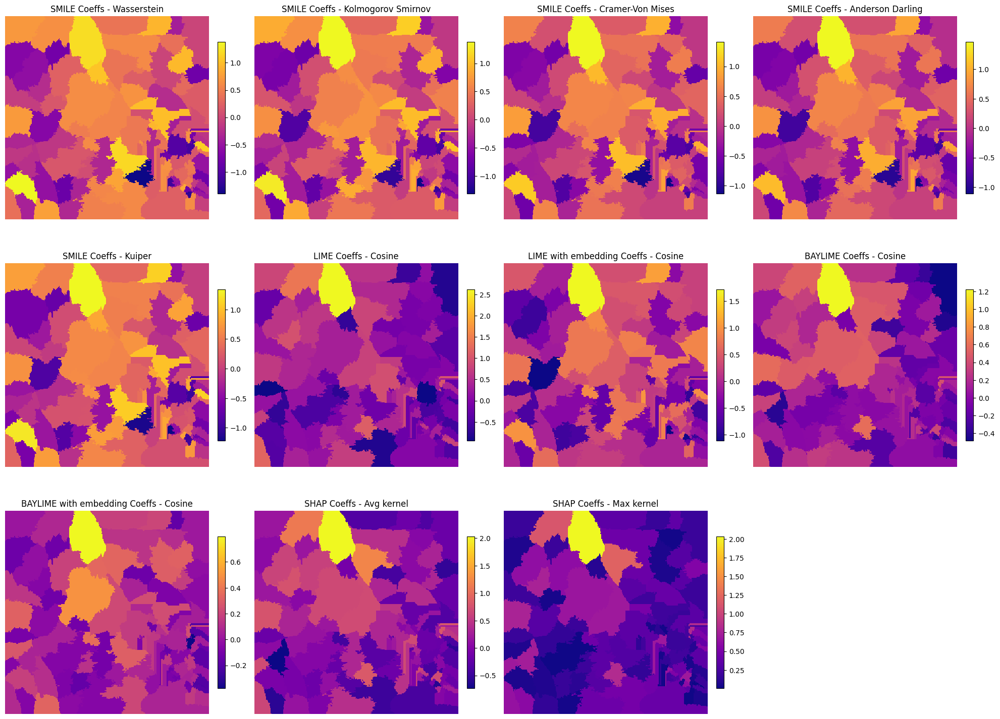

In [21]:
# 3. Plot all heatmaps
SmileImageClassification.plot_comparison_heatmaps(
    all_results,
    save=True,
    filename='all_explanations_comparison.png'
)

<a id = "ref"></a>
<div style="padding:20px;color:white;margin:0;font-size:20px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><b>References</b></div>

<div style="background-color:aliceblue; padding:30px; font-size:15px;color:#034914">
    
* [[Interpretable Machine Learning with LIME for Image Classification]](https://nbviewer.org/url/arteagac.github.io/blog/lime_image.ipynb) by Cristian Arteaga used for Step-by-step implementation of LIME and then the rest of the code was added as the contribution of [X-Why](https://github.com/Dependable-Intelligent-Systems-Lab/xwhy).
* [[LIME Paper:]](https://arxiv.org/abs/1602.04938) Ribeiro, M. T., Singh, S., & Guestrin, C. (2016, August). " Why should i trust you?" Explaining the predictions of any classifier. In Proceedings of the 22nd ACM SIGKDD international conference on knowledge discovery and data mining (pp. 1135-1144). [[LIME GitHub Repo]](https://github.com/marcotcr/lime).
* [[BayLIME Paper:]](https://proceedings.mlr.press/v161/zhao21a/zhao21a.pdf) Zhao, X., Huang, W., Huang, X., Robu, V., and Flynn, D. (2021, December). Baylime: Bayesian local interpretable model-agnostic explanations. In Uncertainty in artificial intelligence (pp. 887-896). PMLR. [[BayLIME GitHub Repo]](https://github.com/x-y-zhao/BayLime).
* [[SafeML Paper 1:]](https://arxiv.org/pdf/2005.13166.pdf) Aslansefat, K., Sorokos, I., Whiting, D., Tavakoli Kolagari, R., & Papadopoulos, Y. (2020). SafeML: safety monitoring of machine learning classifiers through statistical difference measures. In Model-Based Safety and Assessment: 7th International Symposium, IMBSA 2020, Lisbon, Portugal, September 14–16, 2020, Proceedings 7 (pp. 197-211). Springer International Publishing. [[SafeML GitHub Repo]](https://github.com/ISorokos/SafeML).
* [[SafeML Paper 2:]](https://bradscholars.brad.ac.uk/bitstream/handle/10454/18591/Abdullatif_ARA_2021.pdf?sequence=5) Aslansefat, K., Kabir, S., Abdullatif, A., Vasudevan, V., & Papadopoulos, Y. (2021). Toward improving confidence in autonomous vehicle software: A study on traffic sign recognition systems. Computer, 54(8), 66-76. [[SafeML GitHub Repo]](https://github.com/ISorokos/SafeML).   
* [🔥 EDA & ML on Game Play 🎮 (ongoing)](https://www.kaggle.com/code/nguyenthicamlai/eda-ml-on-game-play-ongoing) by [Nguyen Thi Cam Lai](https://www.kaggle.com/nguyenthicamlai) used for HTML-based headers

<center> <a href="#TOC" role="button" aria-pressed="true" >⬆️ Back to Table of Contents ⬆️</a>

<div style="border-radius:10px;border:#034914 solid;padding: 15px;background-color:aliceblue;font-size:90%;text-align:left">

<h4><b>Author :</b> Koorosh Aslansefat </h4>

<h4> <b>Some information:</b> </h4>

<b>👉Check my Kaggle Notebooks :</b> https://www.kaggle.com/kooaslansefat <br>
<b>👉Contact Me :</b> <a href="mailto:koo.ec2008@gmail.com">koo.ec2008@gmail.com</a><br>
<b>👉Find me LinkedIn :</b> www.linkedin.com/in/koorosh-aslansefat <br>
<b>👉Find me Github :</b> https://github.com/koo-ec <br>
    
    
<center> <strong> If you liked this Notebook, please do upvote. </strong>
    
<center> <strong> If you have any questions, feel free to contact me! </strong>
    
<center> <strong> ✨Best Wishes✨ </strong>

<center> <img src="https://gregcfuzion.files.wordpress.com/2022/01/kind-regards-2.png" style='width: 600px; height: 300px;'>